## How can life expectancy be improved through targeted interventions in developing and developed countries

In [2]:

# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics
# Import essential models and functions from sklearn
from sklearn.model_selection import train_test_split as split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeRegressor

import xgboost as xgb

In [3]:
lifedata = pd.read_csv(r"Life Expectancy Data.csv")
lifedata.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## remove data under "Schooling", " Income composition of resources", "under-five deaths" that have value "0"   

## remove population data <20000

## replace empty values with median of status. ( developing countries with empty values replaced with developing countries median, developed countries with empty values replaced with developed countries median)

In [5]:
lifedata = lifedata[
    (lifedata["Income composition of resources"] != 0) &
    (lifedata["under-five deaths "] != 0) &
    (lifedata["Schooling"] != 0)
]

lifedata = lifedata[lifedata["Population"] >= 20000]


# Identify numeric columns in your DataFrame
numeric_cols = lifedata.select_dtypes(include=[np.number]).columns

# Group by 'Status' and fill missing numeric values with the median for each group
lifedata[numeric_cols] = lifedata.groupby('Status')[numeric_cols].transform(lambda x: x.fillna(x.median()))


## remove unnecessary columns (see google doc for reason)

In [7]:
filtered_data1 = lifedata.drop(columns=['GDP','infant deaths','percentage expenditure', ' BMI '])
filtered_data1.head()

,Country,Year,Status,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,0.01,65.0,1154,83,6.0,8.16,65.0,0.1,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,0.01,62.0,492,86,58.0,8.18,62.0,0.1,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,0.01,64.0,430,89,62.0,8.13,64.0,0.1,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,0.01,67.0,2787,93,67.0,8.52,67.0,0.1,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,0.01,68.0,3013,97,68.0,7.87,68.0,0.1,2978599.0,18.2,18.2,0.454,9.5


> **Country** : Name of the country  
> **Year** : Year of the observation  
> **Status** : Developed or Developing status of the country  
> **Life expectancy** : Life Expectancy in years  
> **Adult Mortality** : Adult mortality rate (probability of dying between age 15 and 60 per 1000 population)  
> **Alcohol** : Recorded per capita (age 15+) alcohol consumption in litres of pure alcohol   
> **Hepatitis B** : Hepatitis B immunization coverage among 1-year-olds (%)  
> **Measles** : Reported cases of measles per 1000 population  
> **under-five deaths** : Number of under-five deaths per 1000 population  
> **Polio** : Polio immunization coverage among 1-year-olds (%)  
> **Total expenditure** : Government health expenditure as a percentage of total government expenditure  
> **Diphtheria** : DTP3 immunization coverage among 1-year-olds (%)  
> **HIV/AIDS** : Deaths per 1000 live births due to HIV/AIDS (ages 0–4 years)  
> **Population** : Total population of the country

> **Income composition of resources** : Human Development Index in terms of income composition of resources (index ranging from 0 to 1)  
> **Schooling** : Number of years of Schooling(years)  
> **thinness 1-19 years** : Prevalence of thinness among children and adolescents for Age 10 to 19 (% )  
> **thinness 5-9 years** : Prevalence of thinness among children for Age 5 to 9(%)




## exploratory analysis


In [11]:
print("Data type : ", type(filtered_data1))
print("Data dims : ", filtered_data1.shape)

Data type :  <class 'pandas.core.frame.DataFrame'>
Data dims :  (1577, 18)


In [12]:
print(filtered_data1.dtypes)

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
Alcohol                            float64
Hepatitis B                        float64
Measles                              int64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object


In [13]:
filtered_data1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1577 entries, 0 to 2937
Data columns (total 18 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          1577 non-null   object 
 1   Year                             1577 non-null   int64  
 2   Status                           1577 non-null   object 
 3   Life expectancy                  1577 non-null   float64
 4   Adult Mortality                  1577 non-null   float64
 5   Alcohol                          1577 non-null   float64
 6   Hepatitis B                      1577 non-null   float64
 7   Measles                          1577 non-null   int64  
 8   under-five deaths                1577 non-null   int64  
 9   Polio                            1577 non-null   float64
 10  Total expenditure                1577 non-null   float64
 11  Diphtheria                       1577 non-null   float64
 12   HIV/AIDS                

Status
Developing    1410
Developed      167
Name: count, dtype: int64


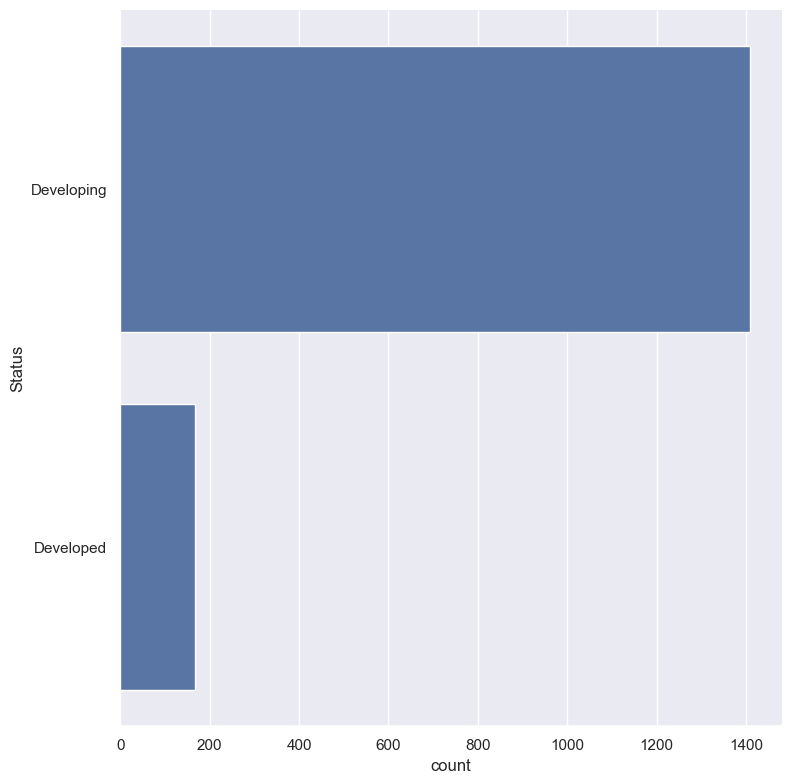

In [14]:


print(filtered_data1["Status"].value_counts())
sb.catplot(y = "Status", data = filtered_data1, kind = "count", height = 8)

In [15]:
# Extract only the numeric data variables
numeric_data = pd.DataFrame(filtered_data1[["Life expectancy ","Adult Mortality", "Alcohol", "Hepatitis B", "Measles ", "under-five deaths ", "Polio", "Total expenditure", "Diphtheria ", " HIV/AIDS", "Population", "Income composition of resources", "Schooling", " thinness  1-19 years", " thinness 5-9 years"]])

# Summary Statistics for all Variables
filtered_data1.describe().round(2)

,Year,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1577.00,1.577000e+03,1577.00,1577.00,1577.00,1577.00
mean,2007.63,66.64,191.34,4.09,79.43,2976.49,62.96,78.60,5.83,79.27,2.72,1.768839e+07,5.42,5.52,0.61,11.31
std,4.59,9.87,138.32,3.69,24.00,10489.49,206.64,25.05,2.21,24.46,6.38,7.275104e+07,4.73,4.83,0.16,3.15
min,2000.00,36.30,1.00,0.01,2.00,0.00,1.00,3.00,0.37,2.00,0.10,2.127400e+04,0.50,0.40,0.25,2.80
25%,2004.00,58.90,86.00,0.76,76.00,0.00,3.00,72.00,4.37,73.00,0.10,6.789140e+05,1.90,1.90,0.46,9.20
50%,2008.00,67.80,163.00,2.87,87.00,63.00,12.00,88.00,5.58,88.00,0.20,2.728777e+06,3.90,4.10,0.62,11.40
75%,2012.00,74.20,273.00,6.74,95.00,982.00,49.00,96.00,7.19,96.00,2.10,1.355847e+07,7.80,7.90,0.73,13.30
max,2015.00,89.00,723.00,17.31,99.00,131441.00,2500.00,99.00,14.39,99.00,50.60,1.293859e+09,27.70,28.60,0.94,20.70


## only have developing countries in dataset first

In [17]:
developing_data = filtered_data1[filtered_data1['Status'] == 'Developing']
developing_data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,0.01,65.0,1154,83,6.0,8.16,65.0,0.1,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,0.01,62.0,492,86,58.0,8.18,62.0,0.1,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,0.01,64.0,430,89,62.0,8.13,64.0,0.1,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,0.01,67.0,2787,93,67.0,8.52,67.0,0.1,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,0.01,68.0,3013,97,68.0,7.87,68.0,0.1,2978599.0,18.2,18.2,0.454,9.5


## make life expectancy dataframe and explore

In [19]:
lifeex = pd.DataFrame(developing_data['Life expectancy '])
lifeex.describe()

,Life expectancy
count,1410.000000
mean,65.181418
std,9.313073
min,36.300000
25%,58.000000
50%,66.100000
75%,73.200000
max,89.000000


<Axes: >

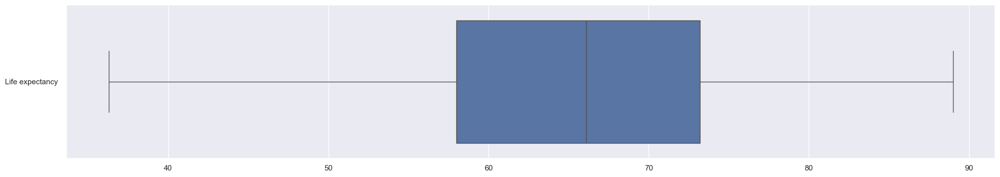

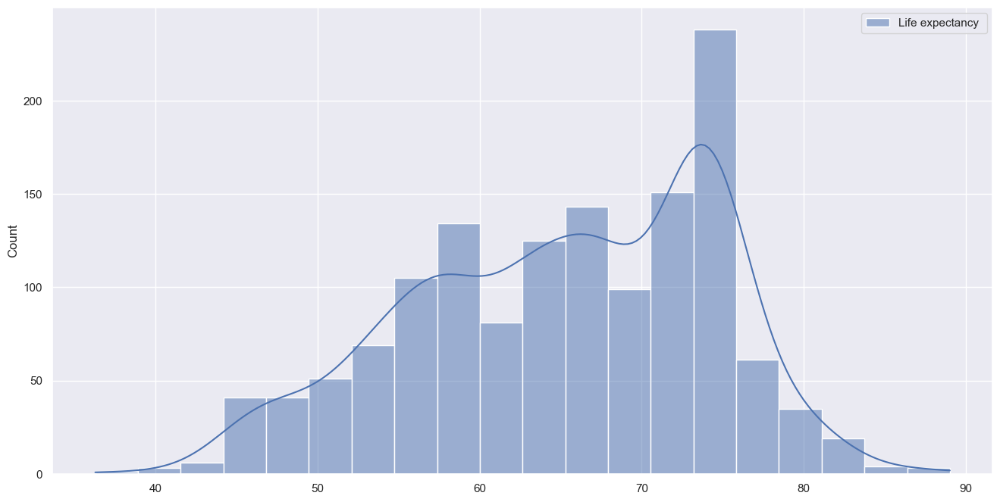

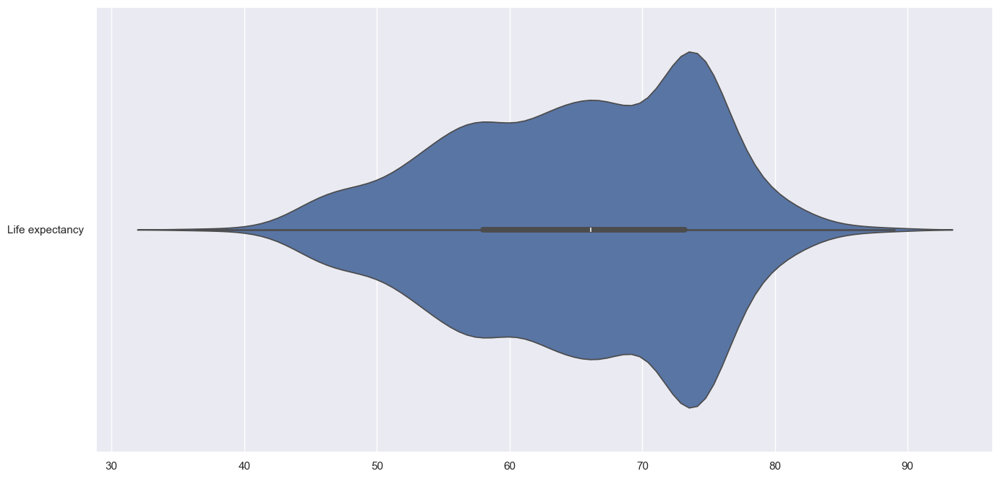

In [20]:
f = plt.figure(figsize=(24, 4))
sb.boxplot(data = lifeex, orient = "h")

f = plt.figure(figsize=(16, 8))
sb.histplot(data = lifeex, kde = True)

f = plt.figure(figsize=(16, 8))
sb.violinplot(data = lifeex, orient = "h")

In [21]:
filtered_data2 = developing_data.drop(columns=["Country", "Year", "Status", " HIV/AIDS"])
filtered_data2.corr()

,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Life expectancy,1.000000,-0.642059,0.188488,0.108088,-0.071399,-0.118896,0.379388,0.074603,0.430649,0.034843,-0.386104,-0.374413,0.844645,0.685490
Adult Mortality,-0.642059,1.000000,-0.015995,-0.054979,-0.017491,0.014595,-0.168670,0.001391,-0.174167,-0.054840,0.196339,0.203203,-0.457043,-0.310592
Alcohol,0.188488,-0.015995,1.000000,0.020245,-0.024891,-0.069674,0.148610,0.183653,0.149995,-0.010831,-0.314620,-0.297473,0.441855,0.483397
Hepatitis B,0.108088,-0.054979,0.020245,1.000000,-0.102421,-0.186920,0.360090,0.116292,0.454874,-0.140113,-0.128790,-0.134813,0.112818,0.113047
Measles,-0.071399,-0.017491,-0.024891,-0.102421,1.000000,0.523556,-0.065574,-0.107237,-0.070160,0.318614,0.257432,0.254029,-0.093295,-0.111055
under-five deaths,-0.118896,0.014595,-0.069674,-0.186920,0.523556,1.000000,-0.130554,-0.145145,-0.144816,0.549169,0.528847,0.535401,-0.151828,-0.177378
Polio,0.379388,-0.168670,0.148610,0.360090,-0.065574,-0.130554,1.000000,0.160452,0.654507,-0.013916,-0.189257,-0.192333,0.401045,0.407512
Total expenditure,0.074603,0.001391,0.183653,0.116292,-0.107237,-0.145145,0.160452,1.000000,0.171496,-0.079643,-0.192975,-0.217726,0.096521,0.197680
Diphtheria,0.430649,-0.174167,0.149995,0.454874,-0.070160,-0.144816,0.654507,0.171496,1.000000,-0.005710,-0.228093,-0.221212,0.440843,0.440528
Population,0.034843,-0.054840,-0.010831,-0.140113,0.318614,0.549169,-0.013916,-0.079643,-0.005710,1.000000,0.283081,0.279258,0.024948,0.009833


<Axes: >

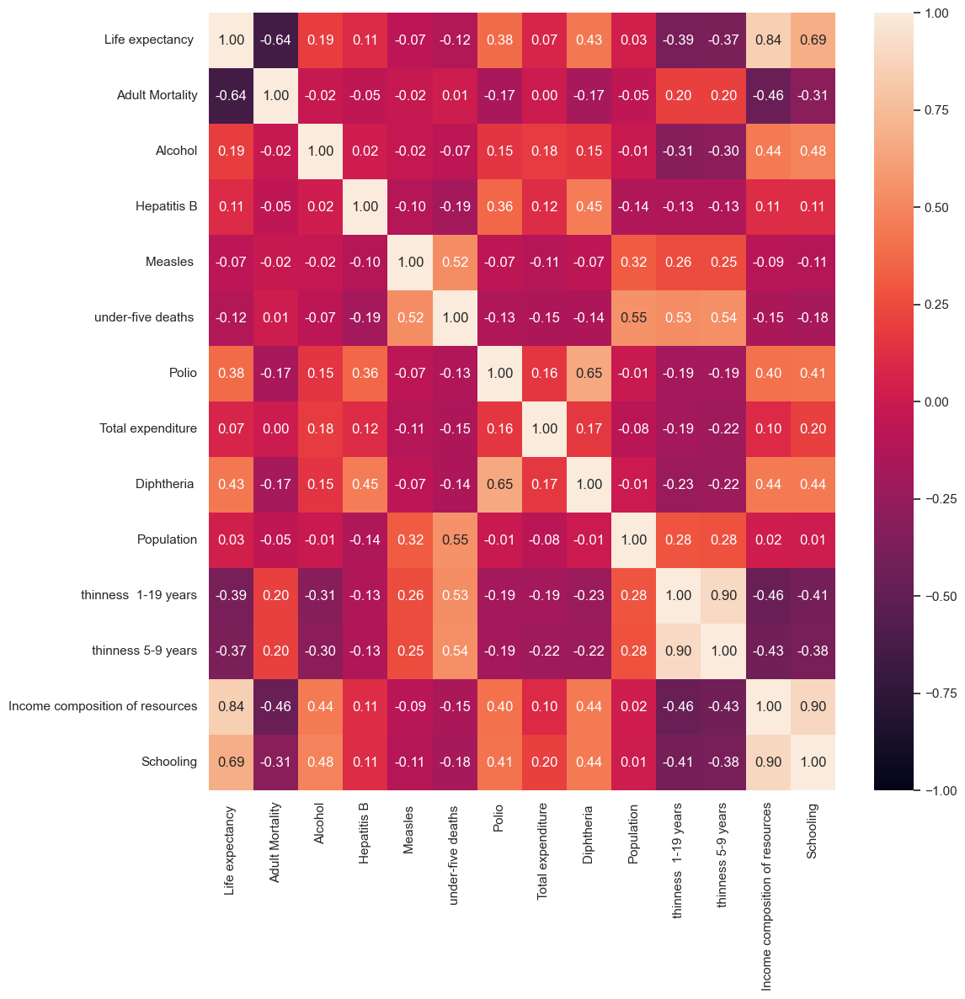

In [22]:
f = plt.figure(figsize=(12, 12))
sb.heatmap(filtered_data2.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")


## we group health outcomes ( adult mortality, HIV/AIDS), immunization coverage (Polio, Diphtheria), socialeconomical factors (Income, schooling), alcohol factor, overall thinness (Thinness 5 - 9, thinness 10-19)

<Axes: >

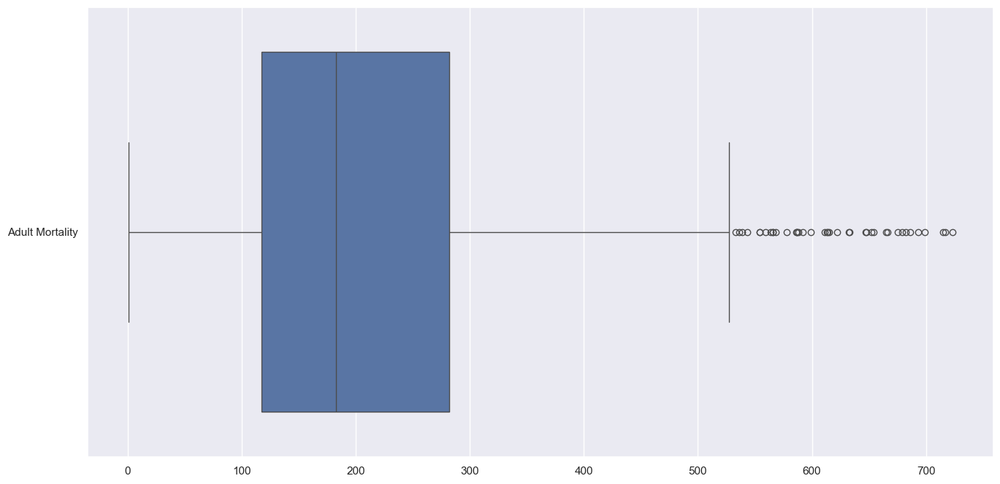

In [24]:
sortDF = pd.DataFrame(filtered_data2[["Adult Mortality"]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

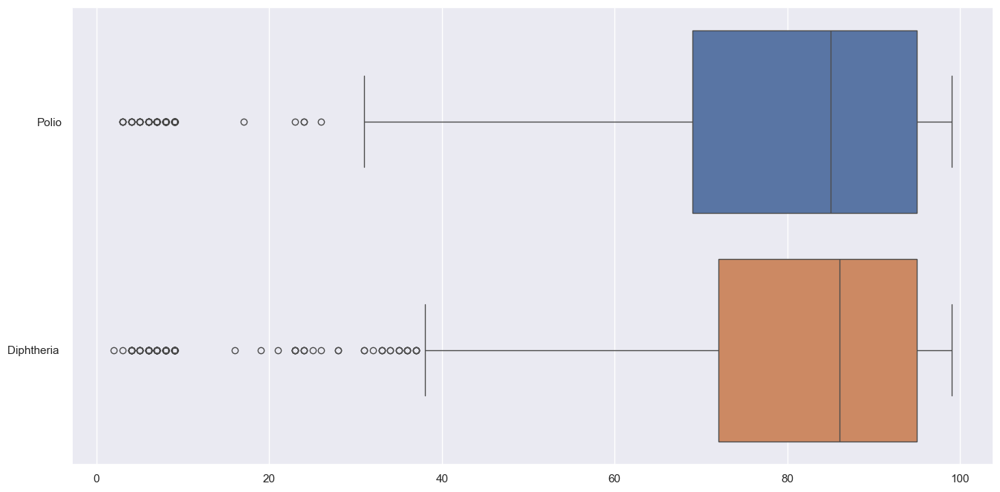

In [25]:
sortDF = pd.DataFrame(filtered_data2[["Polio", "Diphtheria " ]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

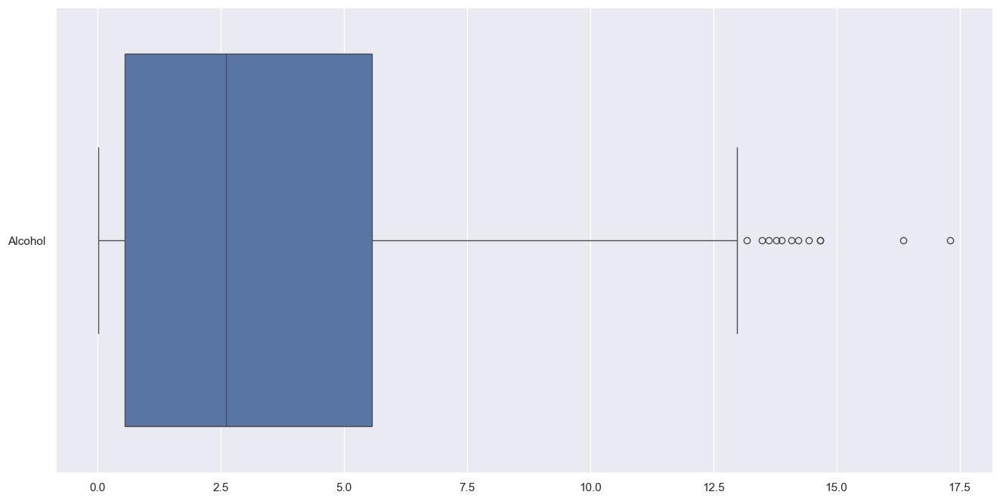

In [26]:
sortDF = pd.DataFrame(filtered_data2[["Alcohol" ]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

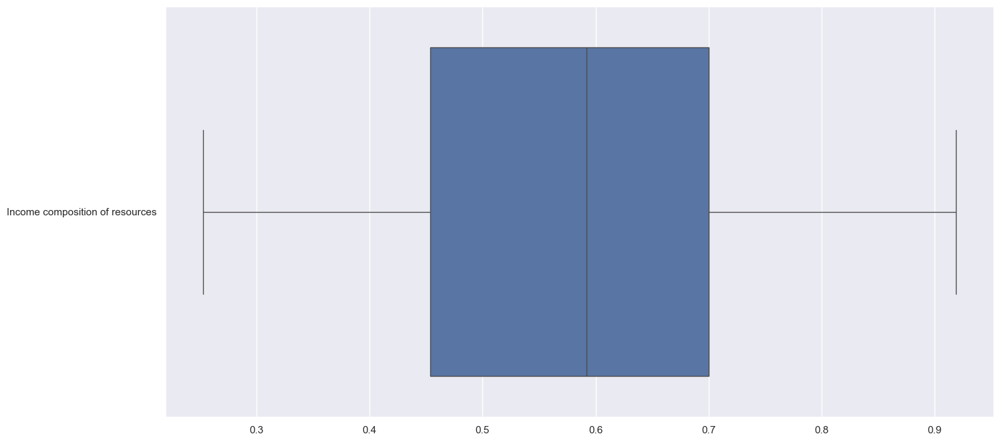

In [27]:
sortDF = pd.DataFrame(filtered_data2[[ "Income composition of resources"]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

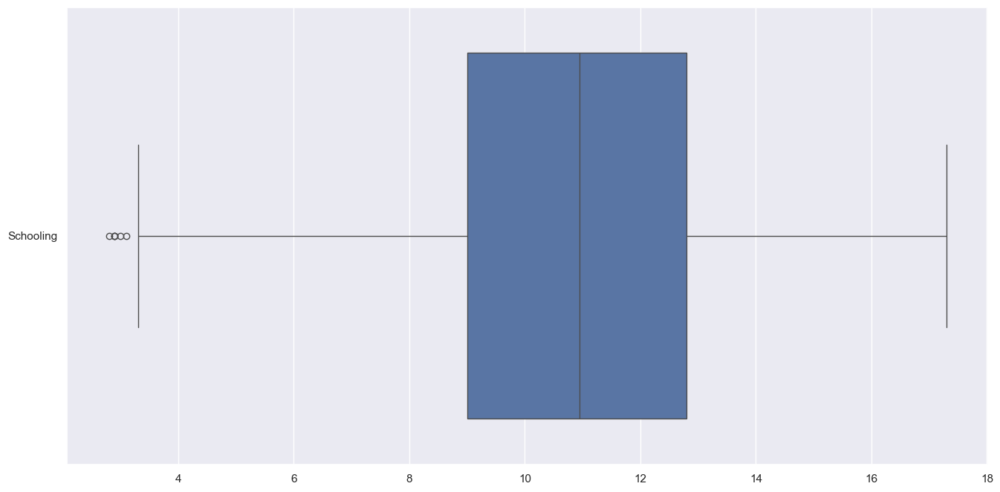

In [28]:
sortDF = pd.DataFrame(filtered_data2[[ "Schooling"]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

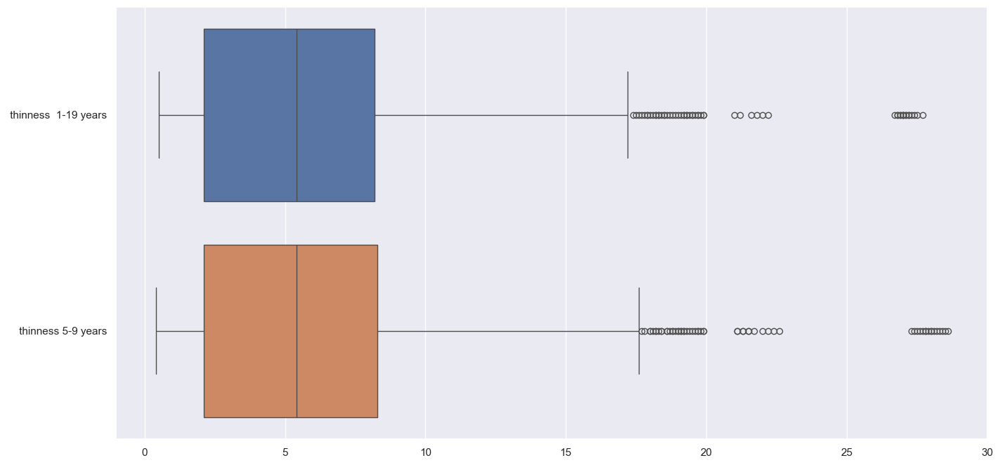

In [29]:
sortDF = pd.DataFrame(filtered_data2[[ " thinness  1-19 years", " thinness 5-9 years"]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

<Axes: >

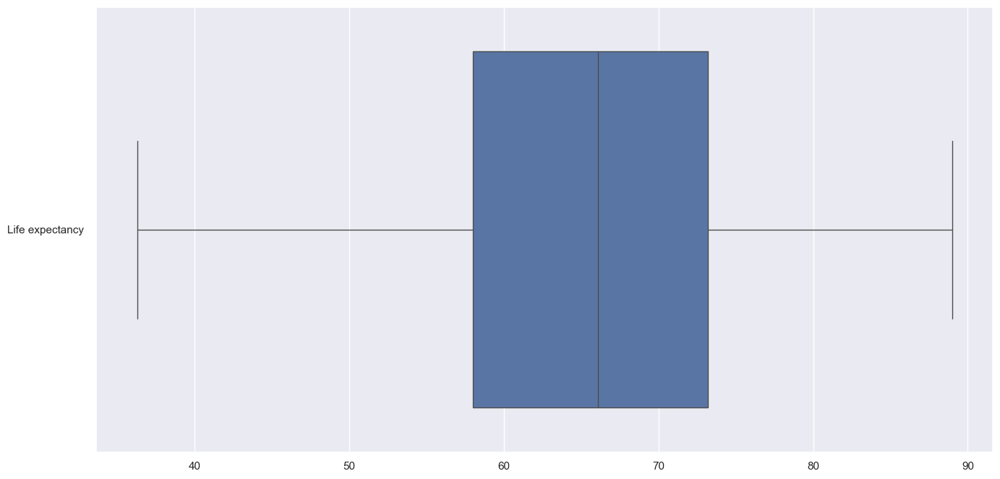

In [30]:
sortDF = pd.DataFrame(filtered_data2[[ "Life expectancy "]])
sortDF.describe()

f = plt.figure(figsize=(16, 8))
sb.boxplot(data = sortDF, orient = "h")

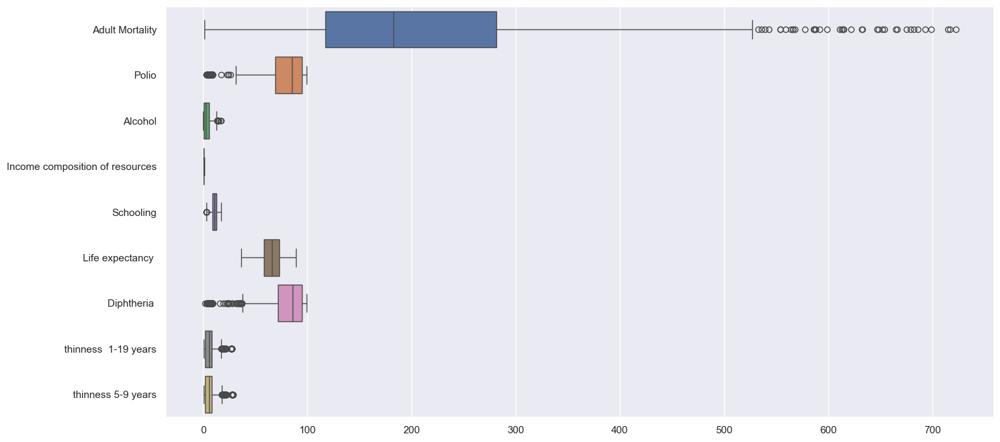

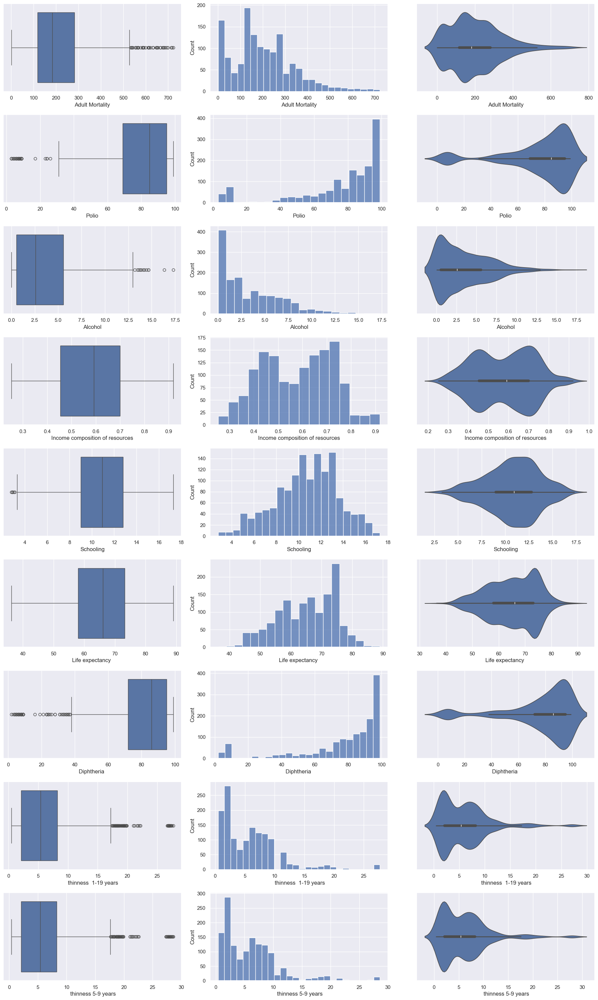

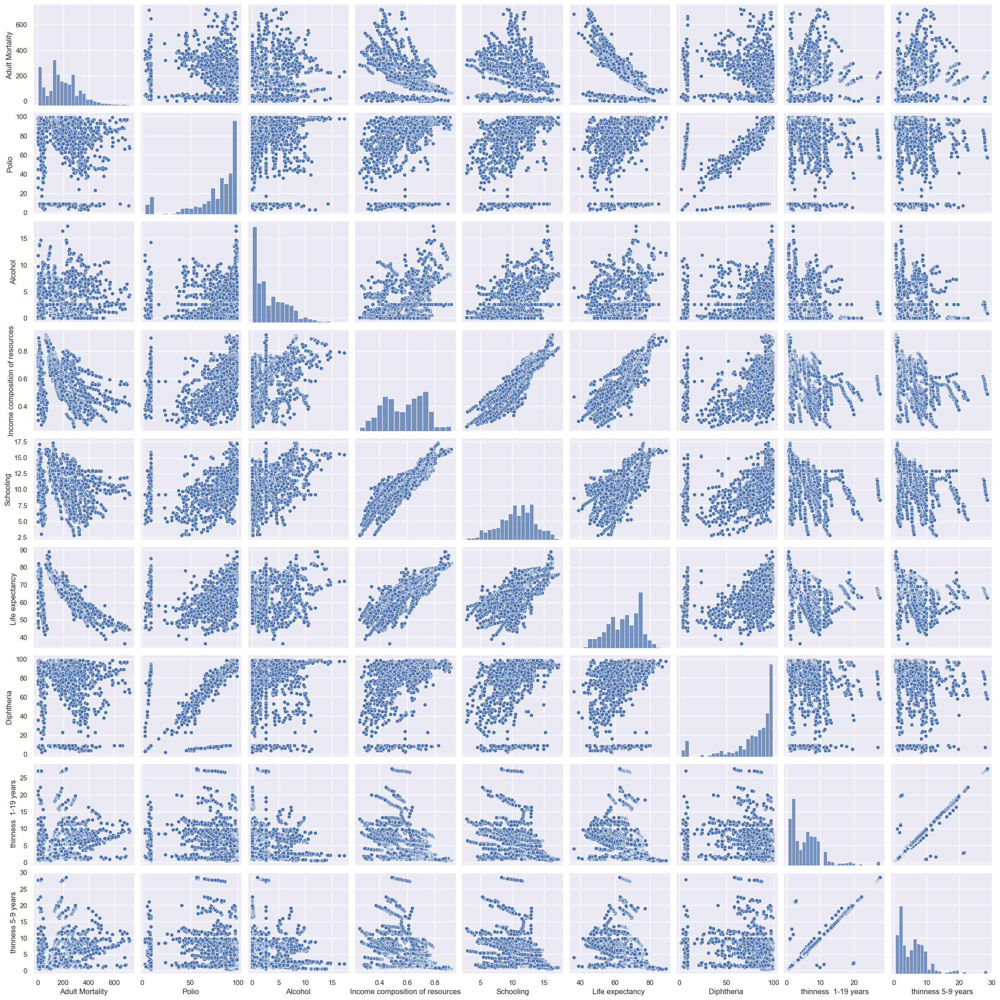

In [31]:
sortDF = pd.DataFrame(filtered_data2[[
    "Adult Mortality", "Polio", "Alcohol", 
    "Income composition of resources", "Schooling", 
    "Life expectancy ", "Diphtheria ", 
    " thinness  1-19 years", " thinness 5-9 years"
]])

# Boxplot overview
f = plt.figure(figsize=(16, 8))
sb.boxplot(data=sortDF, orient="h")
plt.show()

# Create enough rows to match 9 variables
f, axes = plt.subplots(9, 3, figsize=(18, 30))  # changed from 7 to 9

count = 0
for var in sortDF:
    sb.boxplot(data=sortDF[var], orient="h", ax=axes[count, 0])
    sb.histplot(data=sortDF[var], ax=axes[count, 1])
    sb.violinplot(data=sortDF[var], orient="h", ax=axes[count, 2])
    count += 1

plt.tight_layout()
plt.show()

# Pairplot
sb.pairplot(data=sortDF)
plt.show()

## Developed


In [33]:
developed_data = filtered_data1[filtered_data1['Status'] == 'Developed']
developed_data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
112,Australia,2015,Developed,82.8,59.0,10.24,93.0,74,1,93.0,7.79,93.0,0.1,23789338.0,0.6,0.6,0.937,20.4
113,Australia,2014,Developed,82.7,6.0,9.71,91.0,340,1,92.0,9.42,92.0,0.1,2346694.0,0.6,0.6,0.936,20.4
114,Australia,2013,Developed,82.5,61.0,9.87,91.0,158,1,91.0,9.36,91.0,0.1,23117353.0,0.6,0.6,0.933,20.3
115,Australia,2012,Developed,82.3,61.0,10.03,91.0,199,1,92.0,9.36,92.0,0.1,22728254.0,0.6,0.6,0.930,20.1
116,Australia,2011,Developed,82.0,63.0,10.30,92.0,190,1,92.0,9.20,92.0,0.1,223424.0,0.6,0.6,0.927,19.8


In [34]:
lifeex_dlpd = pd.DataFrame(developed_data['Life expectancy '])
lifeex_dlpd.describe()

,Life expectancy
count,167.000000
mean,78.942515
std,4.300888
min,71.100000
25%,75.000000
50%,79.400000
75%,81.900000
max,89.000000


<Axes: >

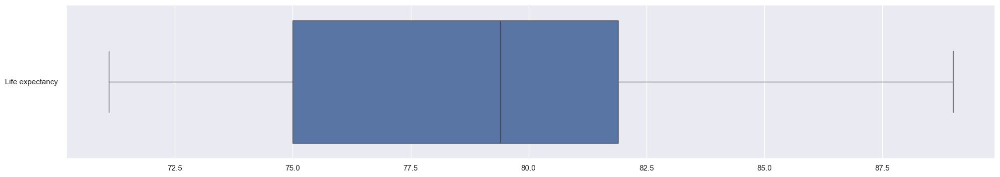

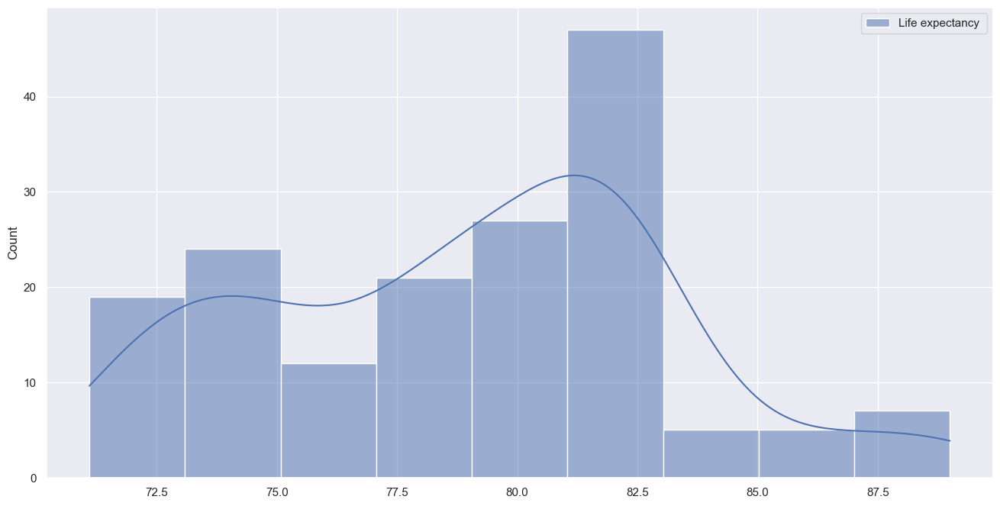

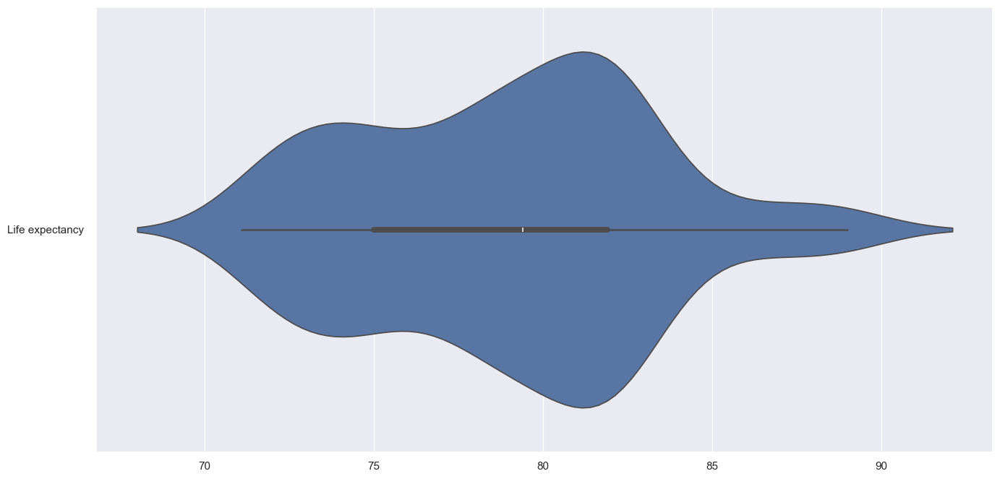

In [35]:
f = plt.figure(figsize=(24, 4))
sb.boxplot(data = lifeex_dlpd, orient = "h")

f = plt.figure(figsize=(16, 8))
sb.histplot(data = lifeex_dlpd, kde = True)

f = plt.figure(figsize=(16, 8))
sb.violinplot(data = lifeex_dlpd, orient = "h")

In [36]:
filtered_data3 = developed_data.drop(columns=["Country", "Year", "Status", " HIV/AIDS"])
filtered_data3.corr()

,Life expectancy,Adult Mortality,Alcohol,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Life expectancy,1.000000,-0.574186,-0.202337,0.001752,0.043164,0.044098,-0.019644,0.021512,-0.008045,0.138946,-0.691012,-0.702902,0.792909,0.567395
Adult Mortality,-0.574186,1.000000,0.092018,0.211795,-0.072637,0.122753,0.065975,-0.168310,-0.005057,-0.087803,0.657778,0.674164,-0.601816,-0.497049
Alcohol,-0.202337,0.092018,1.000000,-0.144628,-0.144816,-0.196577,0.005839,0.061049,-0.074418,0.060950,-0.045443,-0.032247,-0.161276,-0.015507
Hepatitis B,0.001752,0.211795,-0.144628,1.000000,0.066086,0.118331,0.059002,0.005221,0.047684,-0.091660,0.178965,0.179458,-0.143406,-0.218267
Measles,0.043164,-0.072637,-0.144816,0.066086,1.000000,0.391442,-0.299117,0.019906,-0.056203,-0.014795,0.049030,0.009348,-0.006467,-0.149963
under-five deaths,0.044098,0.122753,-0.196577,0.118331,0.391442,1.000000,-0.014177,-0.292897,-0.110609,0.215786,0.374758,0.364618,-0.130406,-0.358683
Polio,-0.019644,0.065975,0.005839,0.059002,-0.299117,-0.014177,1.000000,-0.167160,0.281832,0.073160,0.045085,0.049910,-0.137111,-0.275446
Total expenditure,0.021512,-0.168310,0.061049,0.005221,0.019906,-0.292897,-0.167160,1.000000,0.106287,-0.145116,-0.297718,-0.285963,0.046440,0.226042
Diphtheria,-0.008045,-0.005057,-0.074418,0.047684,-0.056203,-0.110609,0.281832,0.106287,1.000000,0.033277,0.073612,0.071532,-0.062821,-0.111541
Population,0.138946,-0.087803,0.060950,-0.091660,-0.014795,0.215786,0.073160,-0.145116,0.033277,1.000000,-0.183135,-0.157496,0.105611,0.040085


<Axes: >

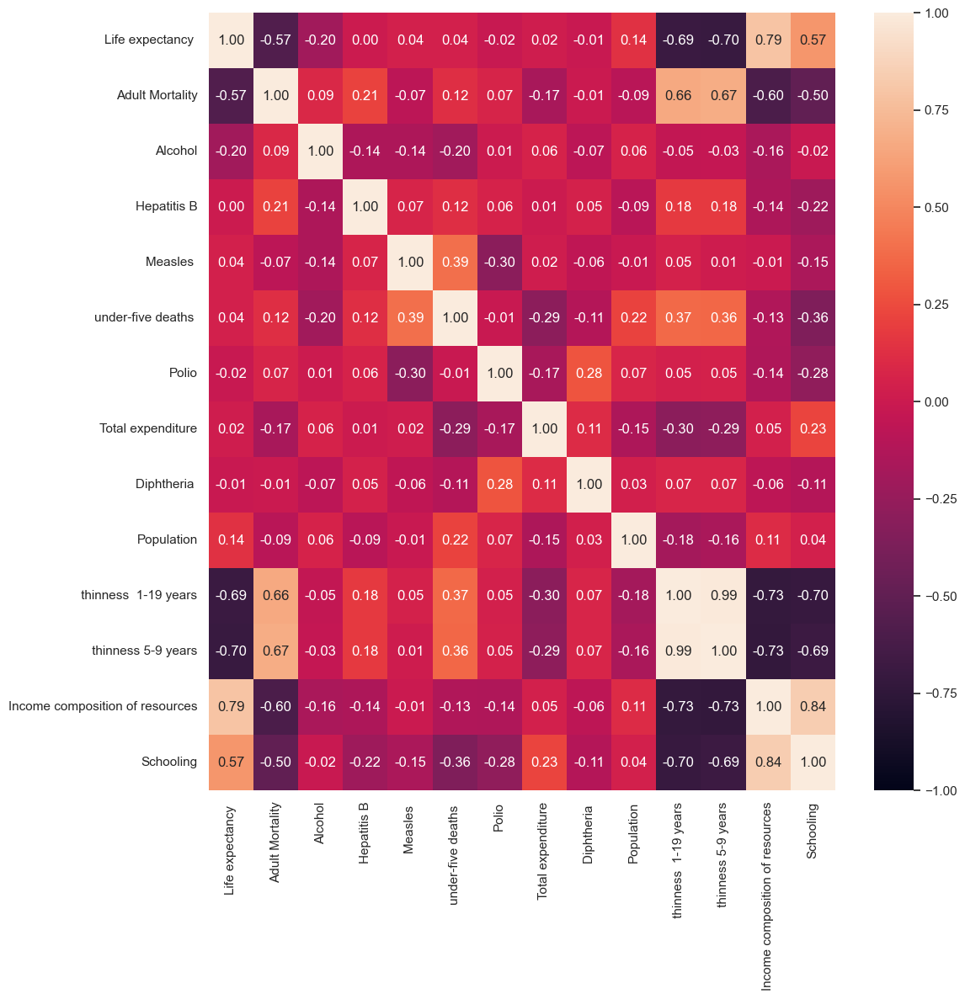

In [37]:
f = plt.figure(figsize=(12, 12))
sb.heatmap(filtered_data3.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")



## we group health outcomes ( adult mortality, HIV/AIDS), immunization coverage (Polio, Diphtheria), socialeconomical factors (Income, schooling), alcohol factor, overall thinness (Thinness 5 - 9, thinness 10-19)

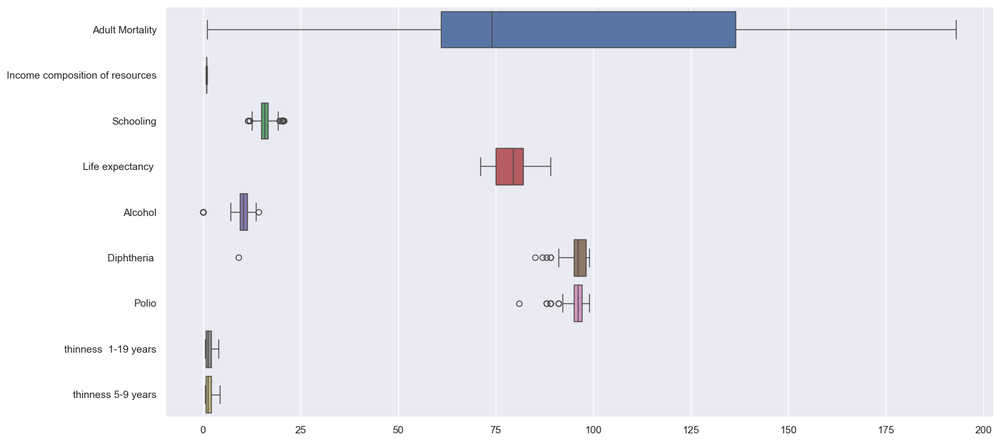

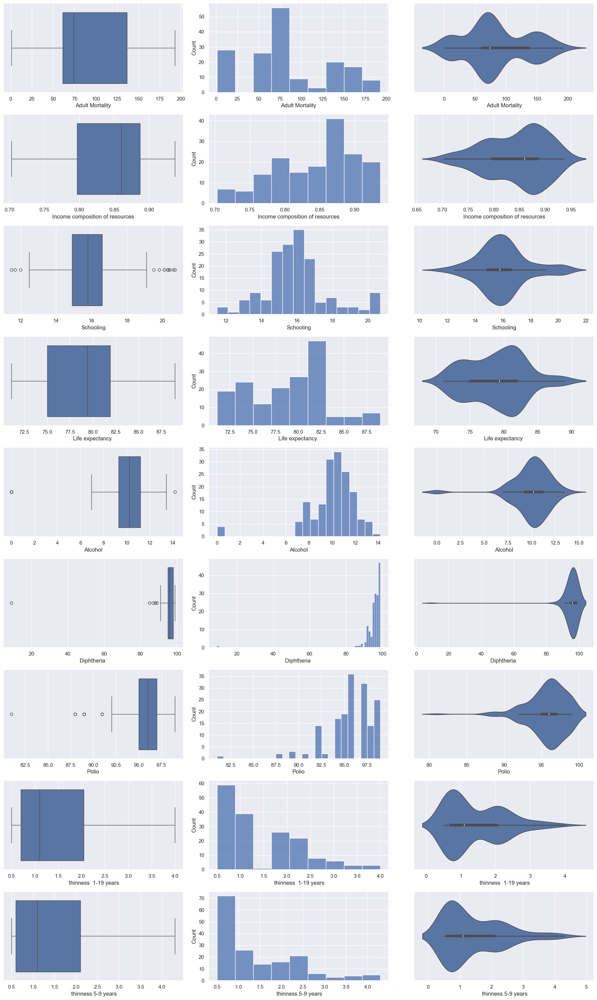

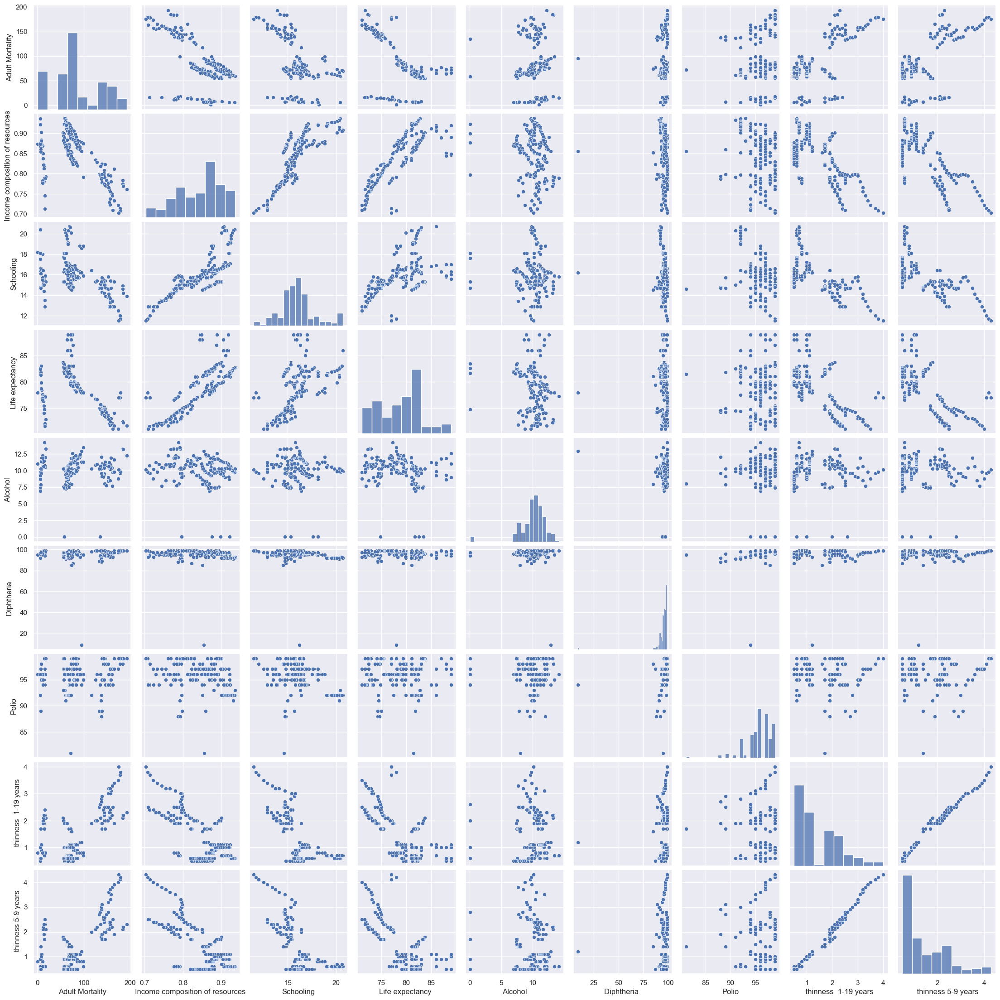

In [40]:
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd

numDF = pd.DataFrame(filtered_data3[[
    "Adult Mortality", "Income composition of resources", "Schooling", 
    "Life expectancy ", "Alcohol", "Diphtheria ",
    "Polio", " thinness  1-19 years", " thinness 5-9 years"
]])

# Summary stats
numDF.describe()

# Overall boxplot
f = plt.figure(figsize=(16, 8))
sb.boxplot(data=numDF, orient="h")
plt.show()

# ✅ Fixed: 9 rows (for 9 variables), 3 plots each
f, axes = plt.subplots(9, 3, figsize=(18, 30))

count = 0
for var in numDF:
    sb.boxplot(data=numDF[var], orient="h", ax=axes[count, 0])
    sb.histplot(data=numDF[var], ax=axes[count, 1])
    sb.violinplot(data=numDF[var], orient="h", ax=axes[count, 2])
    count += 1

plt.tight_layout()
plt.show()

# Pairplot
sb.pairplot(data=numDF)
plt.show()


## Random Forest Function

In [42]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

def evaluate_random_forest_regressor(X_train, X_test, y_train, y_test, feature_name, max_depth=None, n_estimators=100):
   
    y_train = y_train.values.ravel()
    y_test = y_test.values.ravel()


    rf_model = RandomForestRegressor(max_depth=max_depth, n_estimators=n_estimators, random_state=42)
    rf_model.fit(X_train, y_train)

   
    plt.figure(figsize=(20, 10))
    plot_tree(rf_model.estimators_[0], filled=True, feature_names=X_train.columns, rounded=True)
    plt.title(f'Decision Tree from Random Forest ({feature_name})')
    plt.show()


    y_train_pred = rf_model.predict(X_train)
    y_test_pred = rf_model.predict(X_test)


    print(f"Train R² Score ({feature_name}):", r2_score(y_train, y_train_pred))
    print(f"Test R² Score ({feature_name}):", r2_score(y_test, y_test_pred))

    print(f"Train MSE ({feature_name}):", mean_squared_error(y_train, y_train_pred))
    print(f"Test MSE ({feature_name}):", mean_squared_error(y_test, y_test_pred))

    print(f"Train MAE ({feature_name}):", mean_absolute_error(y_train, y_train_pred))
    print(f"Test MAE ({feature_name}):", mean_absolute_error(y_test, y_test_pred))


## XGBoost Function

In [44]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sb
import xgboost as xgb
import numpy as np

def evaluate_xgboost_regressor(X_train, X_test, y_train, y_test, feature_name, max_depth=3, n_estimators=100, learning_rate=0.1):


    xgboost_model = xgb.XGBRegressor(max_depth=max_depth, n_estimators=n_estimators, learning_rate=learning_rate)
    xgboost_model.fit(X_train, y_train)


    plt.figure(figsize=(10, 6))
    xgb.plot_importance(xgboost_model, importance_type='weight', title='Feature Importance', height=0.8)
    plt.show()


    y_train_pred = xgboost_model.predict(X_train)
    y_test_pred = xgboost_model.predict(X_test)


    print("Train R² Score:", r2_score(y_train, y_train_pred))
    print("Test R² Score:", r2_score(y_test, y_test_pred))

    print("Train MSE:", mean_squared_error(y_train, y_train_pred))
    print("Test MSE:", mean_squared_error(y_test, y_test_pred))

    print("Train MAE:", mean_absolute_error(y_train, y_train_pred))
    print("Test MAE:", mean_absolute_error(y_test, y_test_pred))


    reg_line = LinearRegression()
    y_test_array = y_test.values.flatten()
    reg_line.fit(y_test_array.reshape(-1, 1), y_test_pred)
    slope = reg_line.coef_[0]
    intercept = reg_line.intercept_
    print(f"Regression Line Equation (Test): y = {slope:.4f}x + {intercept:.4f}")


    fig, axes = plt.subplots(1, 2, figsize=(24, 6))


    sb.scatterplot(x=y_train.values.flatten(), y=y_train_pred, ax=axes[0])
    axes[0].set_title(f"Train: Actual vs Predicted ({feature_name})")
    axes[0].set_xlabel("Actual Values")
    axes[0].set_ylabel("Predicted Values")


    sb.scatterplot(x=y_test_array, y=y_test_pred, ax=axes[1], label='Predicted')
    axes[1].plot(y_test_array, reg_line.predict(y_test_array.reshape(-1, 1)), color='red', label='Regression Line')
    axes[1].set_title(f"Test: Actual vs Predicted ({feature_name})")
    axes[1].set_xlabel("Actual Values")
    axes[1].set_ylabel("Predicted Values")
    axes[1].legend()

    plt.show()



## Developed XGBoost Starts from here


In [46]:
LE_developed = pd.DataFrame(numDF['Life expectancy '])
Diphtheria_developed = pd.DataFrame(numDF["Diphtheria "])
Diphtheria_developed_train, Diphtheria_developed_test, LE_developed_train, LE_developed_test = split(Diphtheria_developed, LE_developed, test_size=0.25, random_state=42)

In [47]:
Adult_Mortality_developed = pd.DataFrame(numDF["Adult Mortality"])
Adult_Mortality_developed_train, Adult_Mortality_developed_test, LE_developed_train, LE_developed_test = split(Adult_Mortality_developed, LE_developed, test_size=0.25, random_state=42)

Schooling_developed = pd.DataFrame(numDF["Schooling"])
Schooling_developed_train, Schooling_developed_test, LE_developed_train, LE_developed_test = split(Schooling_developed, LE_developed, test_size=0.25, random_state=42)

ICR_developed = pd.DataFrame(numDF["Income composition of resources"])
ICR_developed_train, ICR_developed_test, LE_developed_train, LE_developed_test = split(ICR_developed, LE_developed, test_size=0.25, random_state=42)

Diphtheria_developed = pd.DataFrame(numDF["Diphtheria "])
Diphtheria_developed_train, Diphtheria_developed_test, LE_developed_train, LE_developed_test = split(Diphtheria_developed, LE_developed, test_size=0.25, random_state=42)

Alcohol_developed = pd.DataFrame(numDF["Alcohol"])
Alcohol_developed_train, Alcohol_developed_test, LE_developed_train, LE_developed_test = split(Alcohol_developed, LE_developed, test_size=0.25, random_state=42)

Polio_developed = pd.DataFrame(numDF["Polio"])
Polio_developed_train, Polio_developed_test, LE_developed_train, LE_developed_test = split(Polio_developed, LE_developed, test_size=0.25, random_state=42)


Thinness_1_19_developed = pd.DataFrame(numDF[" thinness  1-19 years"])
Thinness_1_19_developed_train, Thinness_1_19_developed_test, LE_developed_train, LE_developed_test = split(
    Thinness_1_19_developed, LE_developed, test_size=0.25, random_state=42)


Thinness_5_9_developed = pd.DataFrame(numDF[" thinness 5-9 years"])
Thinness_5_9_developed_train, Thinness_5_9_developed_test, LE_developed_train, LE_developed_test = split(
    Thinness_5_9_developed, LE_developed, test_size=0.25, random_state=42)






In [48]:
## Multi_variables for developed

In [49]:
Schooling_ICR_developed = pd.concat([Schooling_developed, ICR_developed], axis=1)
Schooling_ICR_developed_train, Schooling_ICR_developed_test, LE_developed_train, LE_developed_test = split(
    Schooling_ICR_developed, LE_developed, test_size=0.25, random_state=42
)

Diphtheria_Polio_developed = pd.concat([Diphtheria_developed, Polio_developed], axis=1)
Diphtheria_Polio_developed_train, Diphtheria_Polio_developed_test, LE_developed_train, LE_developed_test = split(
    Diphtheria_Polio_developed, LE_developed, test_size=0.25, random_state=42
)


Thinness_Combined_developed = pd.concat([Thinness_1_19_developed, Thinness_5_9_developed], axis=1)


Thinness_Combined_developed_train, Thinness_Combined_developed_test, LE_developed_train, LE_developed_test = split(
    Thinness_Combined_developed, LE_developed, test_size=0.25, random_state=42
)


## XGBoost for developed

<Figure size 1000x600 with 0 Axes>

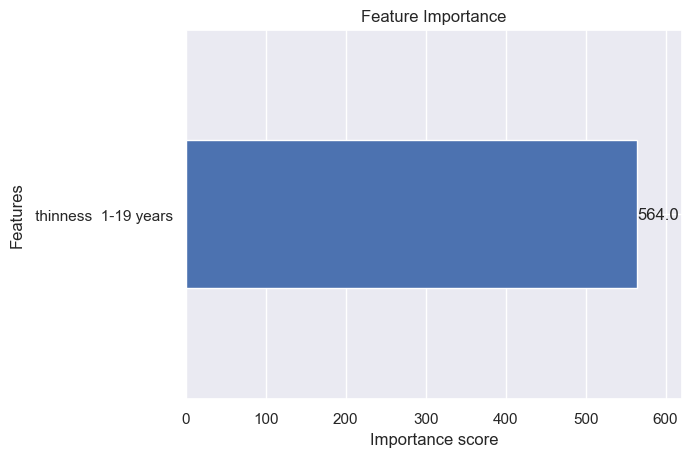

Train R² Score: 0.620092547154844
Test R² Score: 0.6502892162529772
Train MSE: 6.97022197154984
Test MSE: 6.456866420331257
Train MAE: 1.8940630126953126
Test MAE: 1.9325550624302459
Regression Line Equation (Test): y = 0.6569x + 27.4244


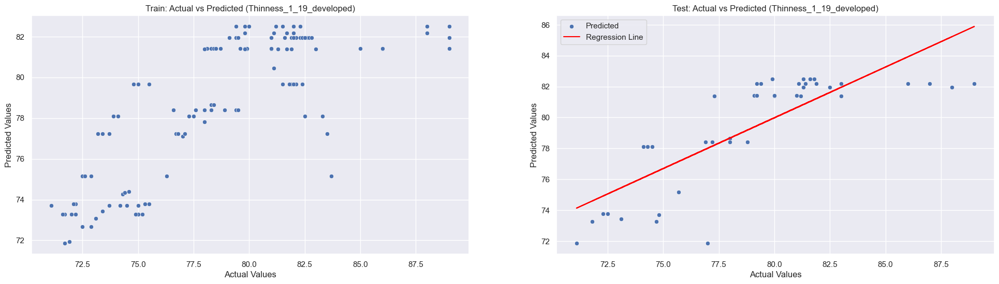

<Figure size 1000x600 with 0 Axes>

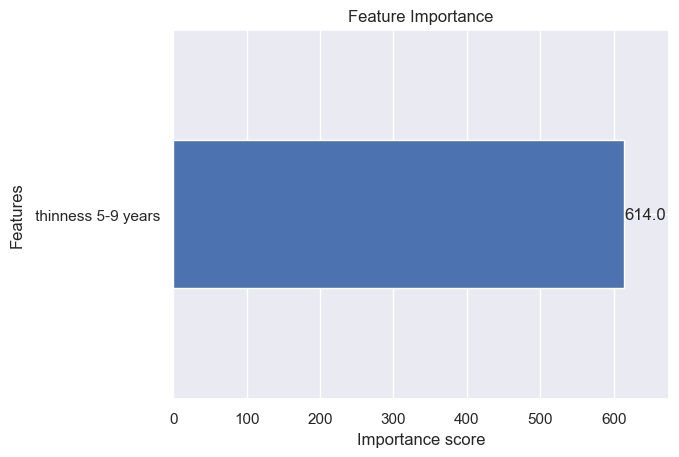

Train R² Score: 0.7112757648073522
Test R² Score: 0.5099039209794558
Train MSE: 5.297269092214854
Test MSE: 9.048862838764851
Train MAE: 1.6153812255859374
Test MAE: 2.114008948916481
Regression Line Equation (Test): y = 0.6162x + 30.7531


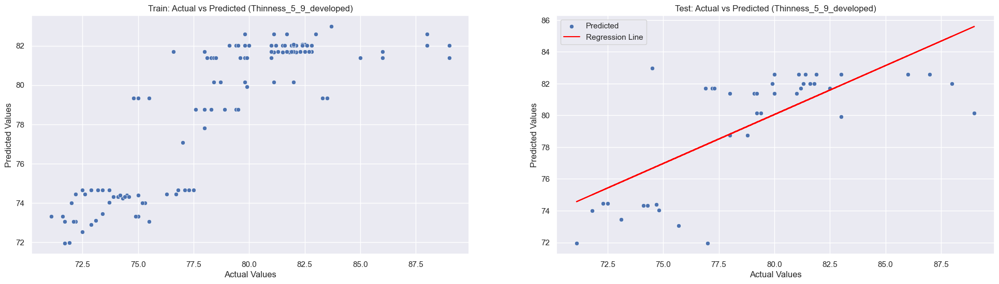

In [51]:
evaluate_xgboost_regressor(
    Thinness_1_19_developed_train, Thinness_1_19_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Thinness_1_19_developed",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

evaluate_xgboost_regressor(
    Thinness_5_9_developed_train, Thinness_5_9_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Thinness_5_9_developed",
    max_depth=3, n_estimators=100, learning_rate=0.1
)


<Figure size 1000x600 with 0 Axes>

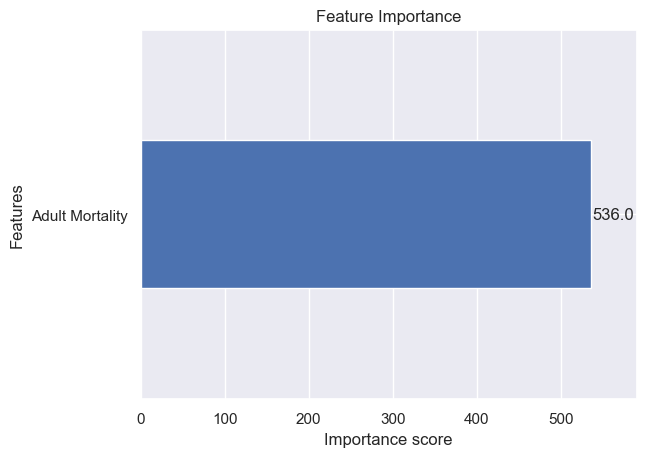

Train R² Score: 0.8968320253468012
Test R² Score: 0.6679880419524512
Train MSE: 1.8928391067419201
Test MSE: 6.1300850951637225
Train MAE: 0.8034477050781247
Test MAE: 1.5359083629789807
Regression Line Equation (Test): y = 0.7163x + 22.1300


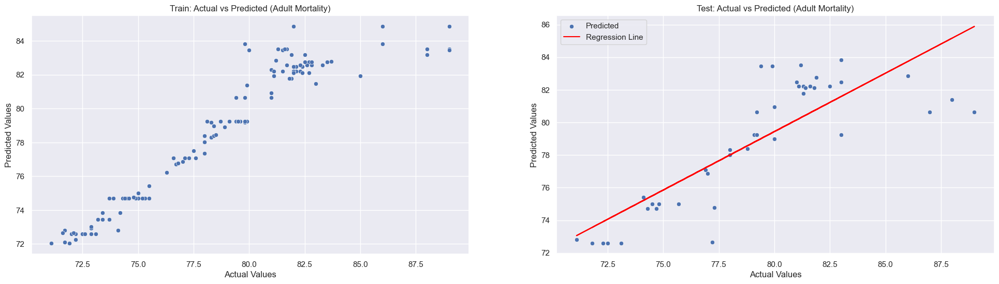

<Figure size 1000x600 with 0 Axes>

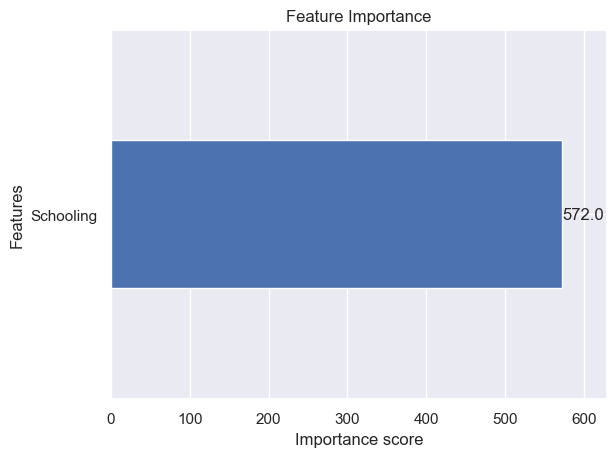

Train R² Score: 0.6791519039276566
Test R² Score: 0.46820325624797965
Train MSE: 5.886650635634921
Test MSE: 9.818800839890198
Train MAE: 1.6895447021484375
Test MAE: 2.2497920445033484
Regression Line Equation (Test): y = 0.4661x + 42.7464


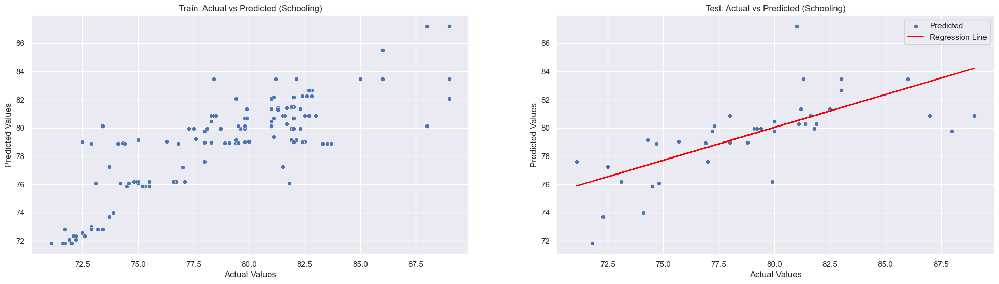

<Figure size 1000x600 with 0 Axes>

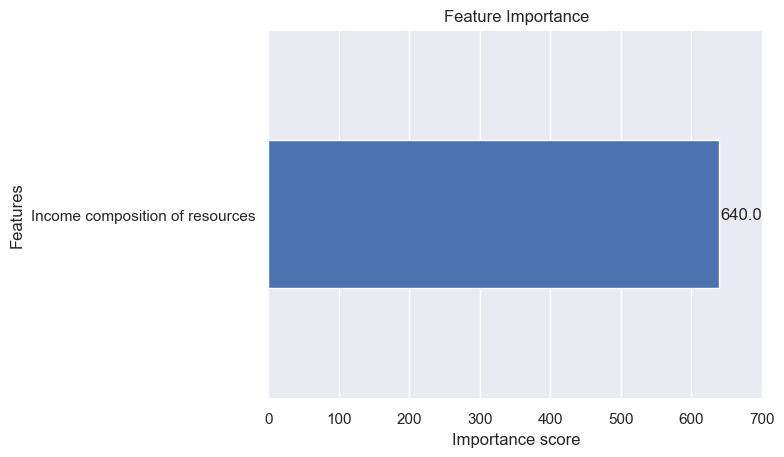

Train R² Score: 0.9074980875463817
Test R² Score: 0.565367719962142
Train MSE: 1.6971471808882432
Test MSE: 8.02480994180194
Train MAE: 1.0259440429687499
Test MAE: 1.9866480872744607
Regression Line Equation (Test): y = 0.7223x + 21.5549


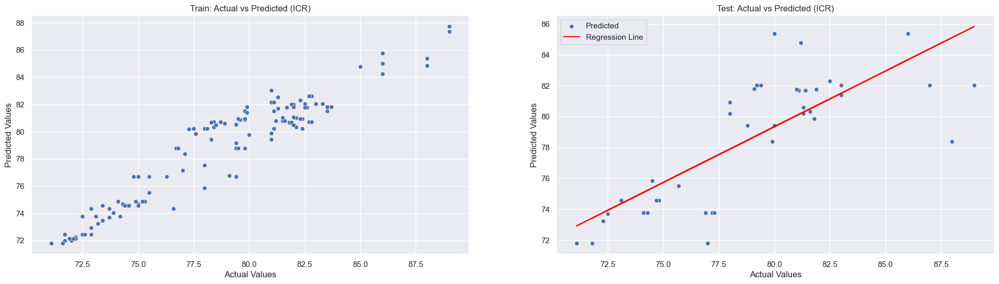

<Figure size 1000x600 with 0 Axes>

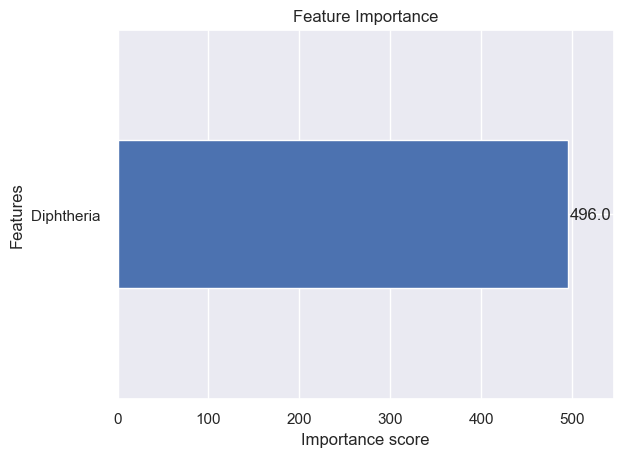

Train R² Score: 0.16816975447282623
Test R² Score: -0.05857590664639023
Train MSE: 15.261720744226594
Test MSE: 19.544959842991922
Train MAE: 2.8645980590820317
Test MAE: 3.129350317092169
Regression Line Equation (Test): y = 0.0550x + 74.3868


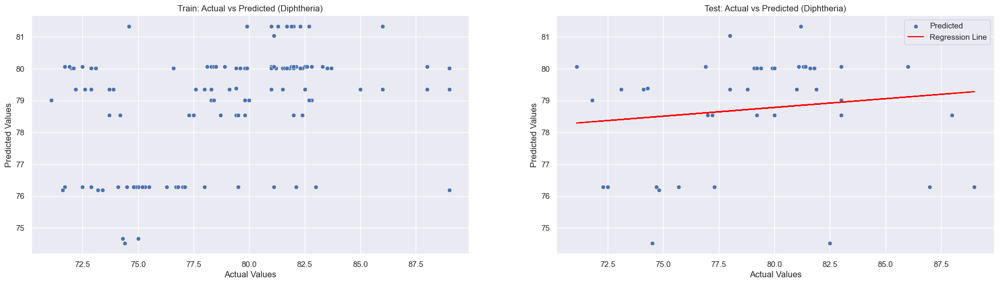

<Figure size 1000x600 with 0 Axes>

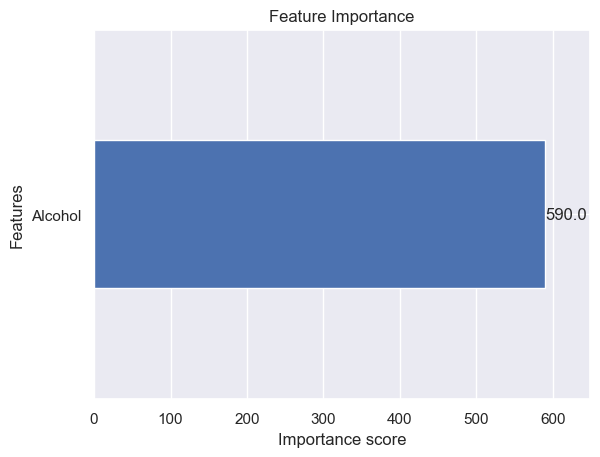

Train R² Score: 0.6467717677611333
Test R² Score: -0.2628496970036449
Train MSE: 6.480734102172405
Test MSE: 23.316558085915062
Train MAE: 2.0729410156249997
Test MAE: 3.367533656529018
Regression Line Equation (Test): y = 0.0071x + 78.2599


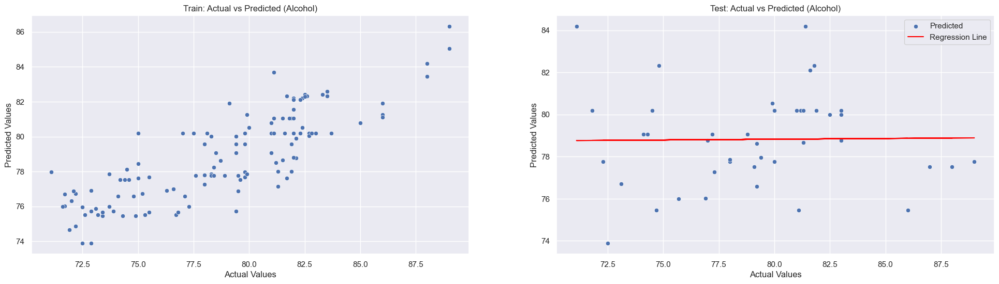

<Figure size 1000x600 with 0 Axes>

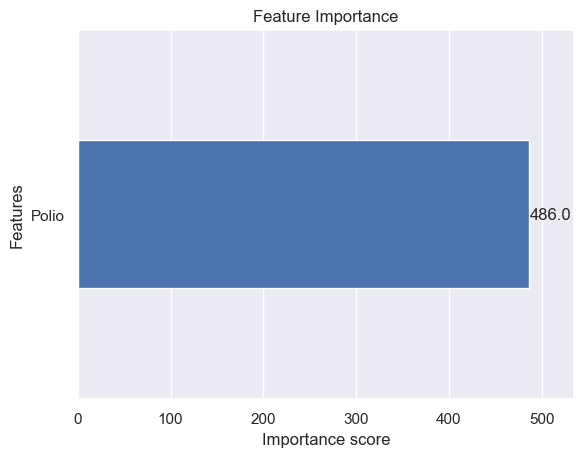

Train R² Score: 0.10010062617837179
Test R² Score: 0.02127167623914239
Train MSE: 16.510595779630627
Test MSE: 18.07069825130144
Train MAE: 3.2432973754882815
Test MAE: 3.15413574945359
Regression Line Equation (Test): y = 0.0637x + 73.5056


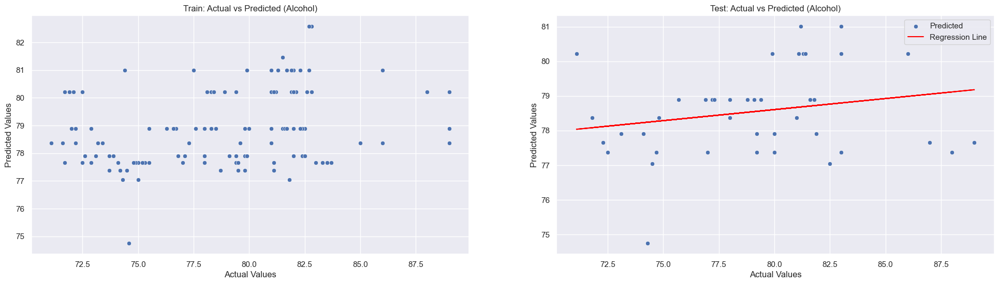

In [52]:
# Adult Mortality
evaluate_xgboost_regressor(
    Adult_Mortality_developed_train, Adult_Mortality_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Adult Mortality",
    max_depth=3, n_estimators=100, learning_rate=0.1
)


# Schooling
evaluate_xgboost_regressor(
    Schooling_developed_train, Schooling_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Schooling",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

# Income Composition of Resources (ICR)
evaluate_xgboost_regressor(
    ICR_developed_train, ICR_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="ICR",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

# Diphtheria
evaluate_xgboost_regressor(
    Diphtheria_developed_train, Diphtheria_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Diphtheria",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

# Alcohol
evaluate_xgboost_regressor(
    Alcohol_developed_train, Alcohol_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Alcohol",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

evaluate_xgboost_regressor(
    Polio_developed_train, Polio_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Alcohol",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

## XGBoost for developed mutli-variate

<Figure size 1000x600 with 0 Axes>

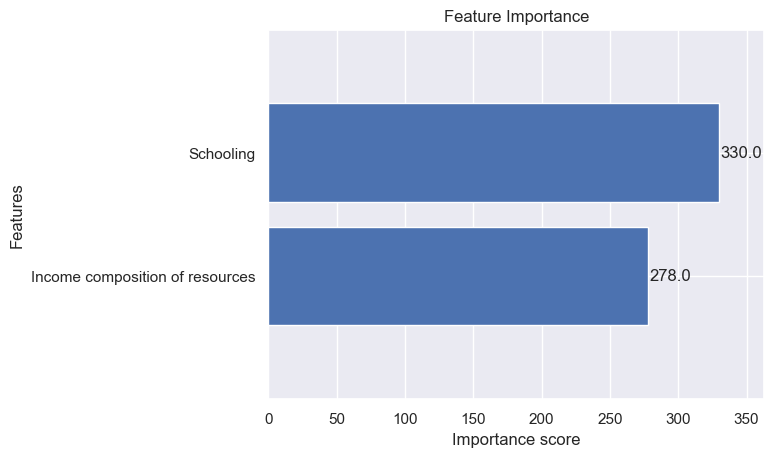

Train R² Score: 0.9613320140653031
Test R² Score: 0.648173699604977
Train MSE: 0.7094476382053458
Test MSE: 6.495926149229996
Train MAE: 0.6294191040039065
Test MAE: 1.6644891284760974
Regression Line Equation (Test): y = 0.6887x + 24.4646


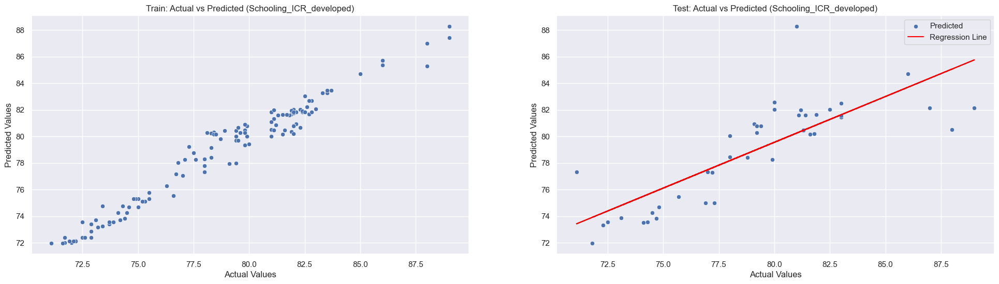

<Figure size 1000x600 with 0 Axes>

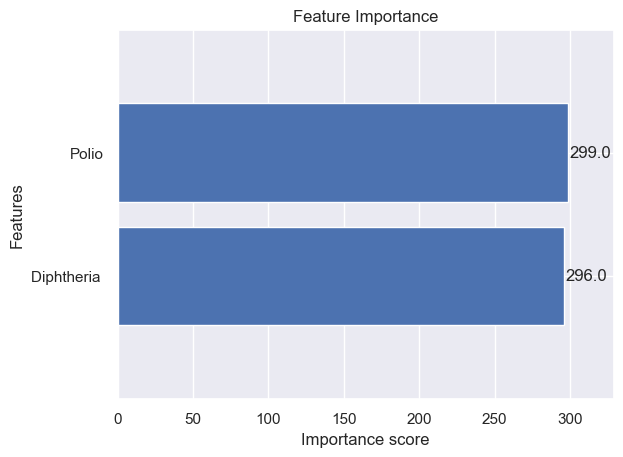

Train R² Score: 0.42708835188288574
Test R² Score: -0.002454188081901565
Train MSE: 10.511300390546303
Test MSE: 18.50875948288961
Train MAE: 2.317276428222656
Test MAE: 2.9224916367303755
Regression Line Equation (Test): y = 0.1927x + 62.5904


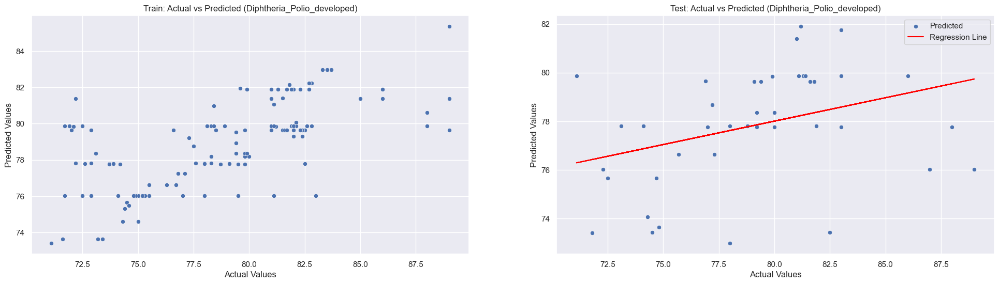

<Figure size 1000x600 with 0 Axes>

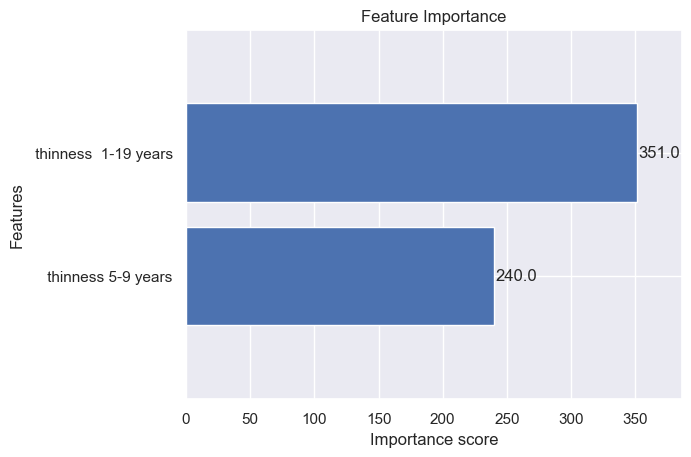

Train R² Score: 0.7968348458189313
Test R² Score: 0.607024518989479
Train MSE: 3.727503135094792
Test MSE: 7.255681852767455
Train MAE: 1.29321357421875
Test MAE: 1.9089945838564921
Regression Line Equation (Test): y = 0.6720x + 26.2537


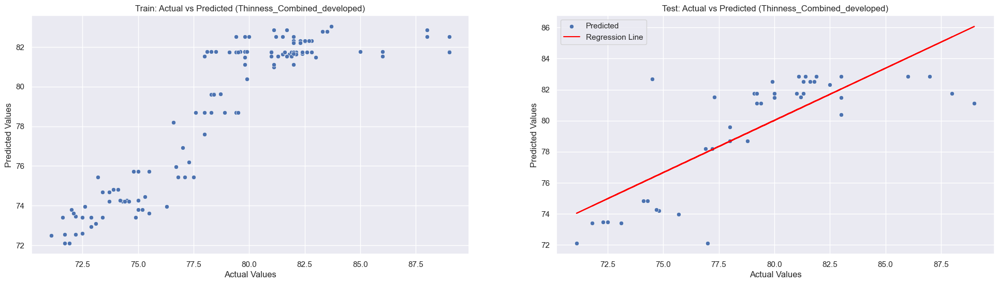

In [54]:
evaluate_xgboost_regressor(
    Schooling_ICR_developed_train, Schooling_ICR_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Schooling_ICR_developed",
    max_depth=3, n_estimators=100, learning_rate=0.1
)


evaluate_xgboost_regressor(
    Diphtheria_Polio_developed_train, Diphtheria_Polio_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Diphtheria_Polio_developed",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

evaluate_xgboost_regressor(
    Thinness_Combined_developed_train, Thinness_Combined_developed_test, LE_developed_train, LE_developed_test ,
    feature_name="Thinness_Combined_developed",
    max_depth=3, n_estimators=100, learning_rate=0.1
)



## Creating Developing Variables

In [56]:
Adult_Mortality_developing = pd.DataFrame(sortDF["Adult Mortality"])
LE_developing = pd.DataFrame(sortDF['Life expectancy '])
Adult_Mortality_developing_train, Adult_Mortality_developing_test, LE_developing_train, LE_developing_test = split(Adult_Mortality_developing, LE_developing, test_size=0.25, random_state=42)

In [57]:
Schooling_developing = pd.DataFrame(sortDF["Schooling"])
Schooling_developing_train, Schooling_developing_test, LE_developing_train, LE_developing_test = split(Schooling_developing, LE_developing, test_size=0.25, random_state=42)

In [58]:
ICR_developing = pd.DataFrame(sortDF["Income composition of resources"])
ICR_developing_train, ICR_developing_test, LE_developing_train, LE_developing_test = split(ICR_developing, LE_developing, test_size=0.25, random_state=42)

In [59]:
Diphtheria_developing = pd.DataFrame(sortDF["Diphtheria "])
Diphtheria_developing_train, Diphtheria_developing_test, LE_developing_train, LE_developing_test = split(Diphtheria_developing, LE_developing, test_size=0.25, random_state=42)

In [60]:
Polio_developing = pd.DataFrame(sortDF["Polio"])
Polio_developing_train, Polio_developing_test, LE_developing_train, LE_developing_test = split(Polio_developing, LE_developing, test_size=0.25, random_state=42)


In [61]:
Alcohol_developing = pd.DataFrame(sortDF["Alcohol"])
Alcohol_developing_train, Alcohol_developing_test, LE_developing_train, LE_developing_test = split(Alcohol_developing, LE_developing, test_size=0.25, random_state=42)


Thinness_1_19_developing = pd.DataFrame(sortDF[" thinness  1-19 years"])
Thinness_1_19_developing_train, Thinness_1_19_developing_test, LE_developing_train, LE_developing_test = split(
    Thinness_1_19_developing, LE_developing, test_size=0.25, random_state=42)



Thinness_5_9_developing = pd.DataFrame(sortDF[" thinness 5-9 years"])
Thinness_5_9_developing_train, Thinness_5_9_developing_test, LE_developing_train, LE_developing_test = split(
    Thinness_5_9_developing, LE_developing, test_size=0.25, random_state=42)



## Creating Multi Variates for Developing

In [63]:

Schooling_ICR_developing = pd.concat([Schooling_developing, ICR_developing], axis=1)
Schooling_ICR_developing_train, Schooling_ICR_developing_test, LE_developing_train, LE_developing_test = split(
    Schooling_ICR_developing, LE_developing, test_size=0.25, random_state=42
)

Diphtheria_Polio_developing= pd.concat([Diphtheria_developing, Polio_developing], axis=1)
Diphtheria_Polio_developing_train, Diphtheria_Polio_developing_test, LE_developing_train, LE_developing_test = split(
    Diphtheria_Polio_developing, LE_developing, test_size=0.25, random_state=42
)

Thinness_Combined_developing = pd.concat([Thinness_1_19_developing, Thinness_5_9_developing], axis=1)


Thinness_Combined_developing_train, Thinness_Combined_developing_test, LE_developing_train, LE_developing_test = split(
    Thinness_Combined_developing, LE_developing, test_size=0.25, random_state=42
)




## XGBoost for developing

<Figure size 1000x600 with 0 Axes>

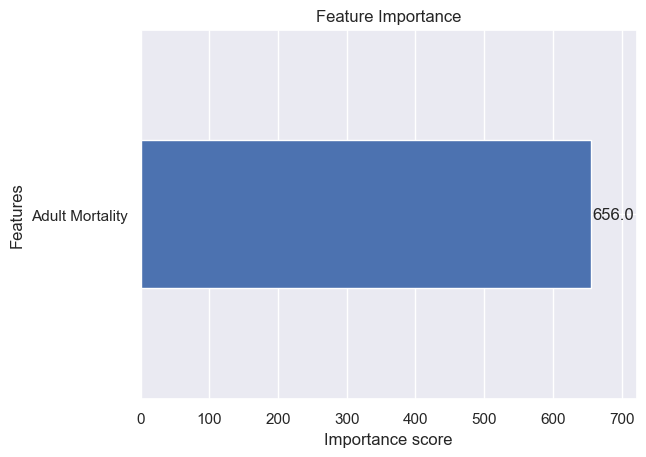

Train R² Score: 0.838146612459261
Test R² Score: 0.7932584384106999
Train MSE: 13.586073413245845
Test MSE: 19.609030150654046
Train MAE: 2.5105868307959955
Test MAE: 2.978116190534813
Regression Line Equation (Test): y = 0.7733x + 15.0619


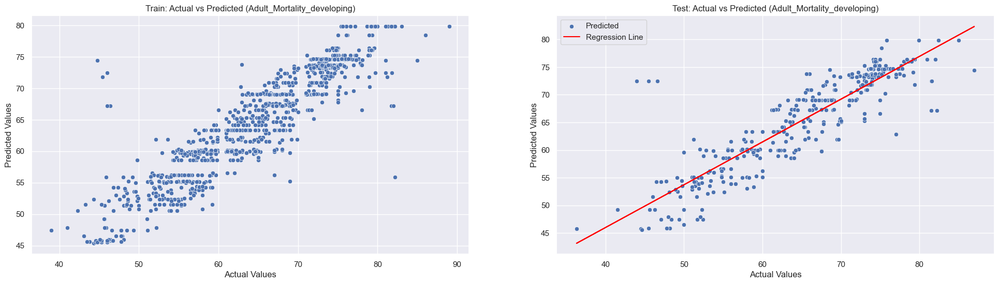

In [65]:
evaluate_xgboost_regressor(Adult_Mortality_developing_train, Adult_Mortality_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Adult_Mortality_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)





<Figure size 1000x600 with 0 Axes>

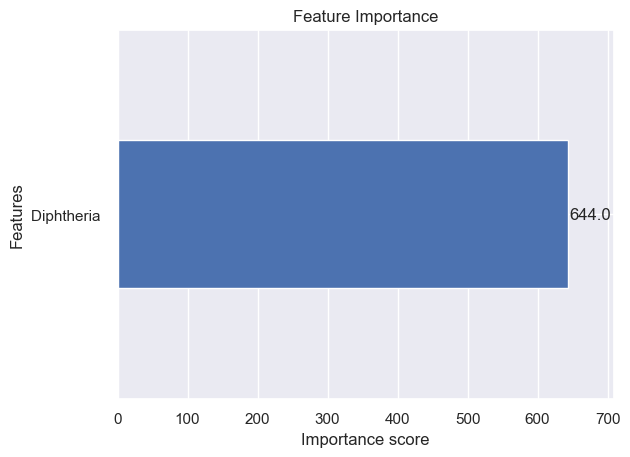

Train R² Score: 0.39615328822193885
Test R² Score: 0.33766209845791617
Train MSE: 50.68726630450597
Test MSE: 62.821446164078104
Train MAE: 5.562121327958698
Test MAE: 6.290816474028418
Regression Line Equation (Test): y = 0.3437x + 42.6970


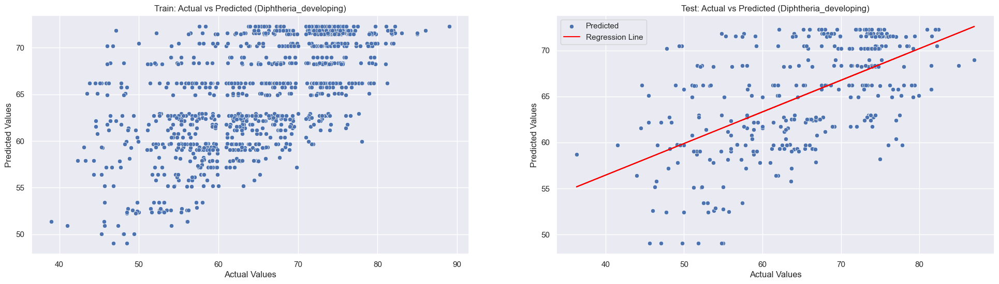

In [66]:
evaluate_xgboost_regressor(Diphtheria_developing_train, 
                                 Diphtheria_developing_test, 
                                 LE_developing_train, 
                                 LE_developing_test, 
                                 feature_name="Diphtheria_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

<Figure size 1000x600 with 0 Axes>

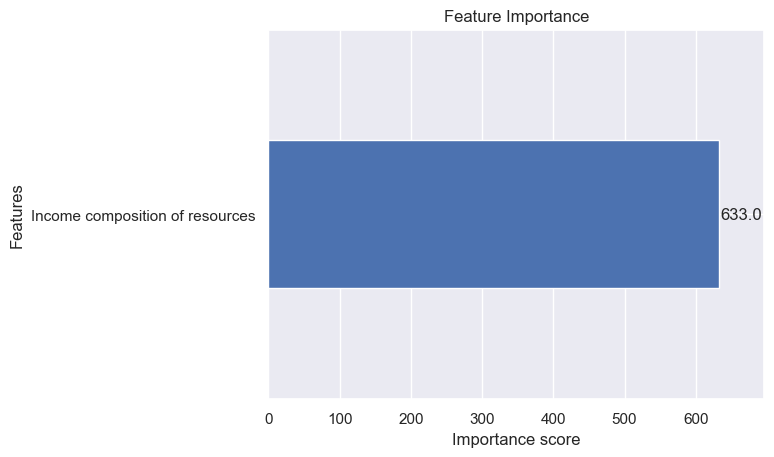

Train R² Score: 0.7501064358473697
Test R² Score: 0.7053840512226066
Train MSE: 20.976220267374675
Test MSE: 27.943742796699716
Train MAE: 3.4794821667919327
Test MAE: 4.094929969074369
Regression Line Equation (Test): y = 0.6784x + 20.9653


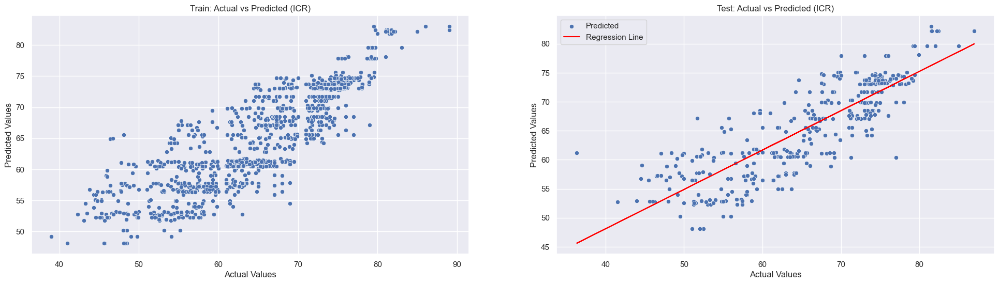

In [67]:
evaluate_xgboost_regressor(ICR_developing_train, ICR_developing_test, LE_developing_train, LE_developing_test,
                                 feature_name="ICR", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

<Figure size 1000x600 with 0 Axes>

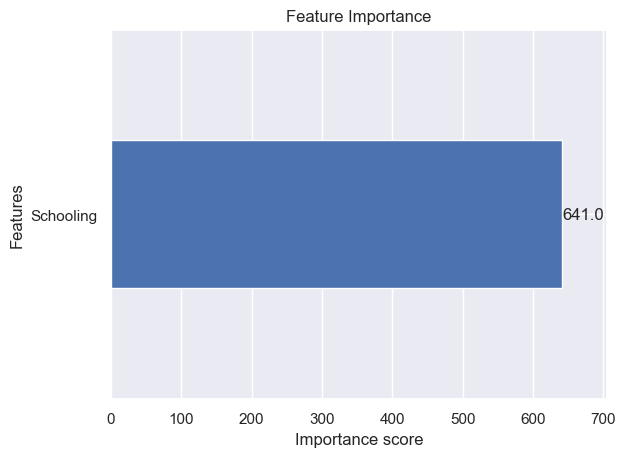

Train R² Score: 0.5425655479247968
Test R² Score: 0.5113108423471928
Train MSE: 38.397330708183866
Test MSE: 46.35120462980762
Train MAE: 4.778433273012276
Test MAE: 5.462983580419092
Regression Line Equation (Test): y = 0.4852x + 33.2816


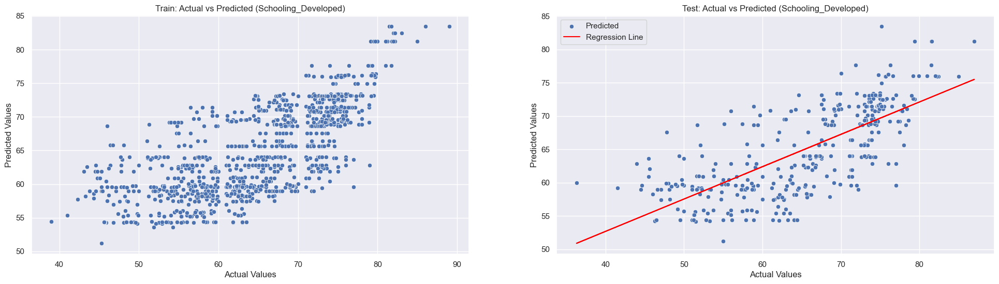

In [68]:
evaluate_xgboost_regressor(Schooling_developing_train, Schooling_developing_test, LE_developing_train, LE_developing_test,
                                 feature_name="Schooling_Developed", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

<Figure size 1000x600 with 0 Axes>

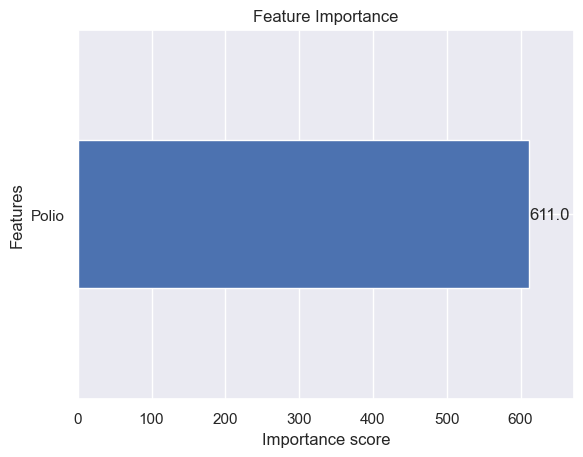

Train R² Score: 0.3839192162044358
Test R² Score: 0.3127572778686786
Train MSE: 51.71420187316002
Test MSE: 65.18361937239088
Train MAE: 5.645092966157305
Test MAE: 6.3991544556009865
Regression Line Equation (Test): y = 0.3368x + 43.1238


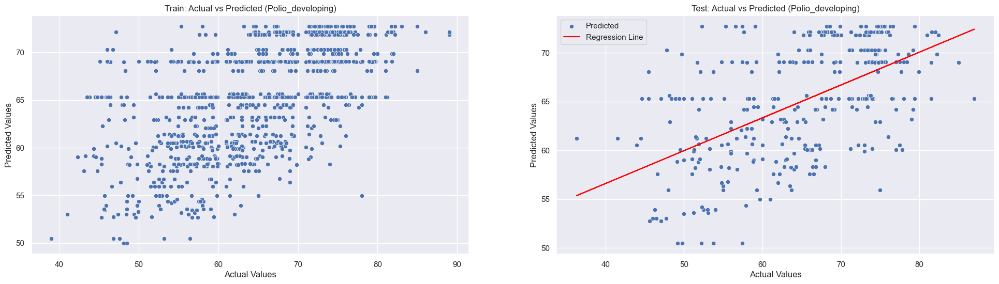

In [69]:
evaluate_xgboost_regressor(Polio_developing_train, Polio_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Polio_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

<Figure size 1000x600 with 0 Axes>

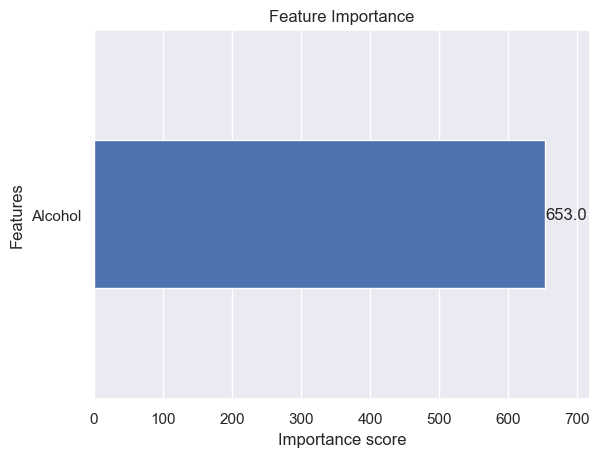

Train R² Score: 0.21950581678222691
Test R² Score: 0.023885279101521162
Train MSE: 65.51516426641982
Test MSE: 92.58255981745548
Train MAE: 6.685849127503308
Test MAE: 7.862697121509412
Regression Line Equation (Test): y = 0.0690x + 60.9889


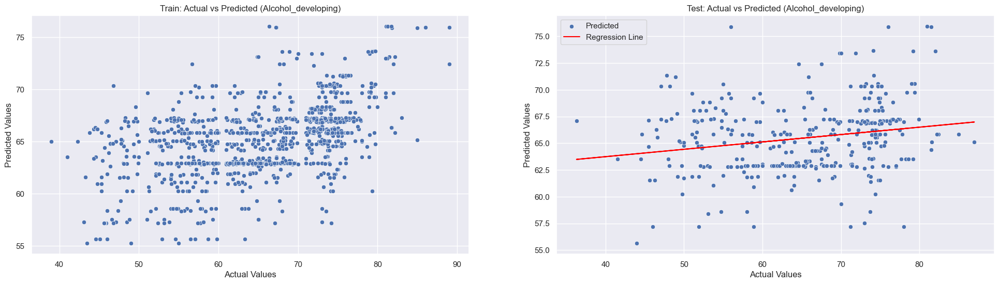

In [70]:
evaluate_xgboost_regressor(Alcohol_developing_train, Alcohol_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Alcohol_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

<Figure size 1000x600 with 0 Axes>

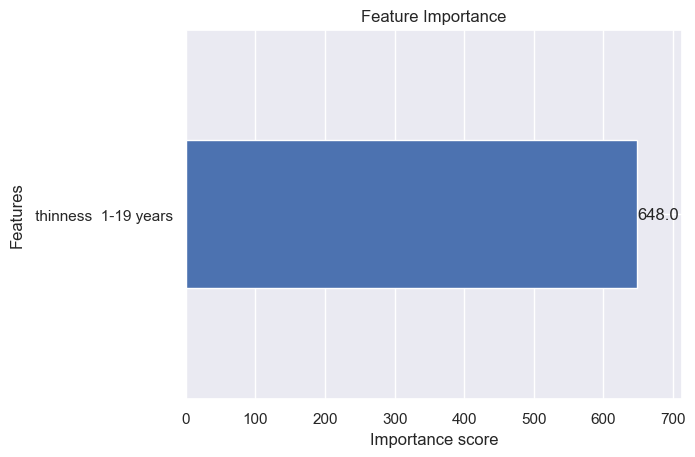

Train R² Score: 0.45914716862455407
Test R² Score: 0.43022294947273265
Train MSE: 45.399521038626126
Test MSE: 54.04223164926586
Train MAE: 5.110470268516576
Test MAE: 5.511168465330647
Regression Line Equation (Test): y = 0.4120x + 38.4496


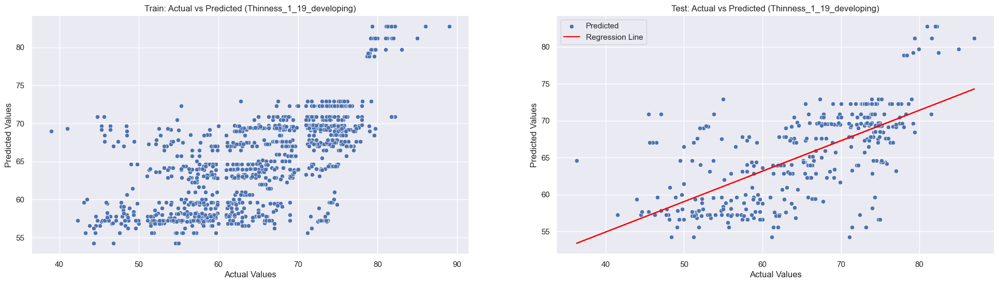

<Figure size 1000x600 with 0 Axes>

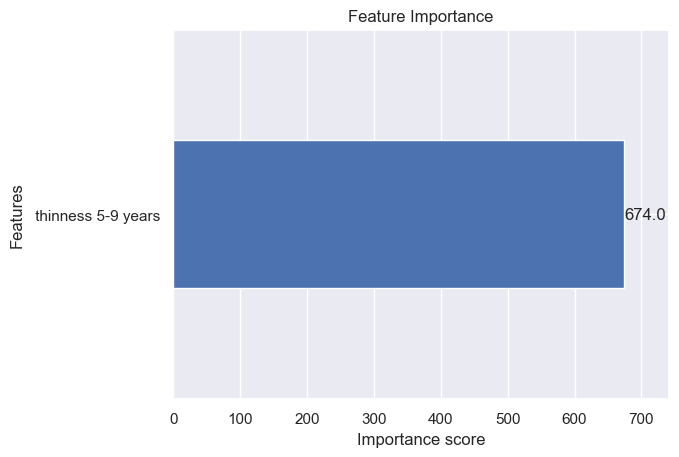

Train R² Score: 0.4594443426568984
Test R² Score: 0.4065507019500968
Train MSE: 45.3745760666284
Test MSE: 56.28749772850367
Train MAE: 5.101452428841208
Test MAE: 5.646327395344591
Regression Line Equation (Test): y = 0.4007x + 39.1722


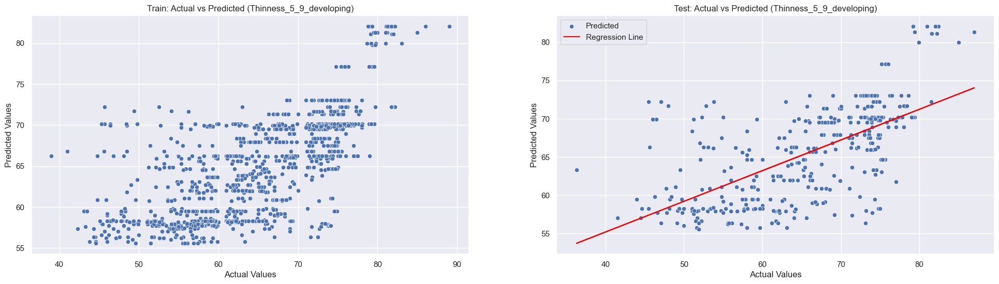

In [71]:
evaluate_xgboost_regressor(
    Thinness_1_19_developing_train, Thinness_1_19_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Thinness_1_19_developing",
    max_depth=3, n_estimators=100, learning_rate=0.1
)

evaluate_xgboost_regressor(
    Thinness_5_9_developing_train, Thinness_5_9_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Thinness_5_9_developing",
    max_depth=3, n_estimators=100, learning_rate=0.1
)


## XGBoost for developing multi-variates

<Figure size 1000x600 with 0 Axes>

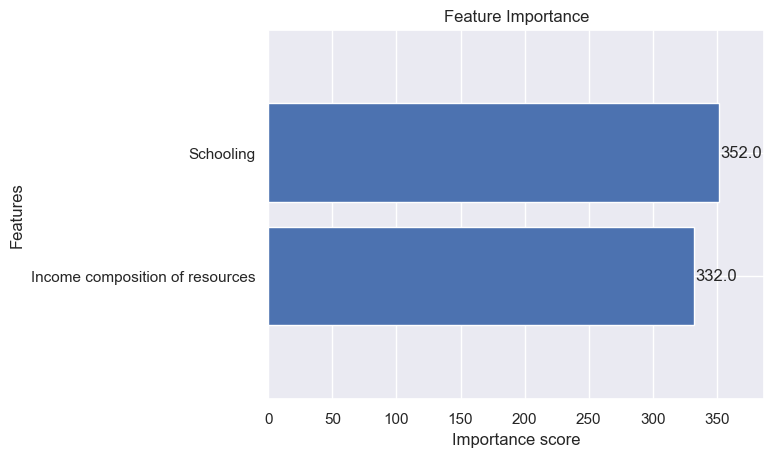

Train R² Score: 0.8279667762290193
Test R² Score: 0.7463400952854518
Train MSE: 14.440575159921204
Test MSE: 24.05914263838587
Train MAE: 2.885169022920116
Test MAE: 3.734753923713317
Regression Line Equation (Test): y = 0.7085x + 19.2261


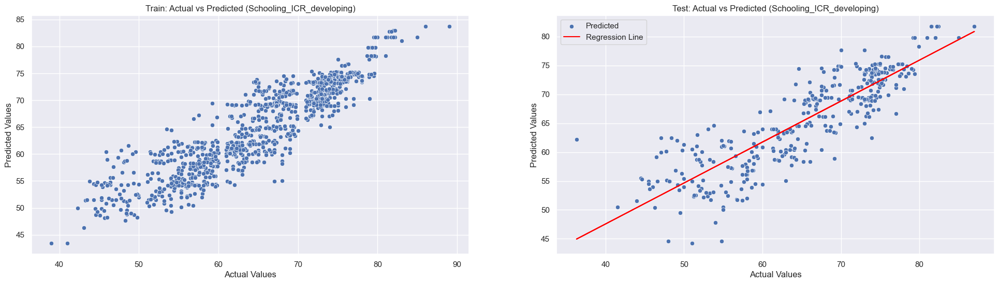

In [73]:
evaluate_xgboost_regressor(Schooling_ICR_developing_train, Schooling_ICR_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Schooling_ICR_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)



<Figure size 1000x600 with 0 Axes>

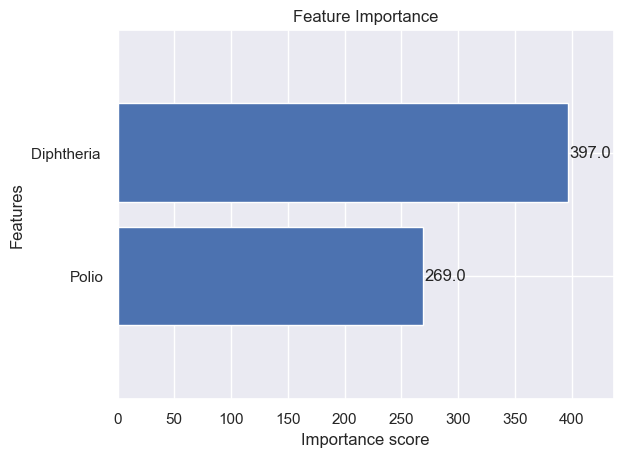

Train R² Score: 0.442045651509845
Test R² Score: 0.33886969939983536
Train MSE: 46.835032957953956
Test MSE: 62.70690759187223
Train MAE: 5.3311076724540545
Test MAE: 6.21170887285184
Regression Line Equation (Test): y = 0.3470x + 42.5705


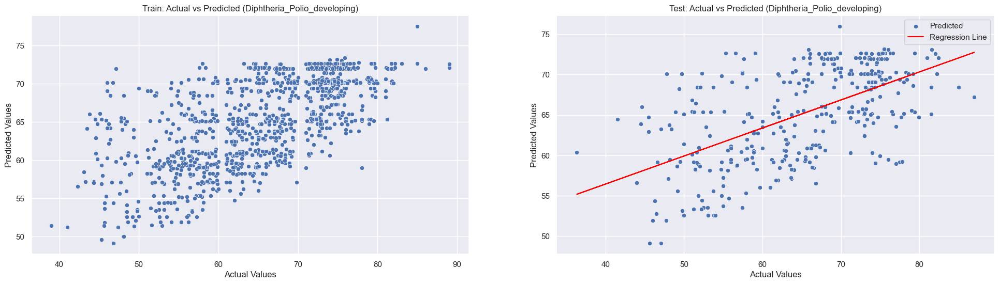

In [74]:
evaluate_xgboost_regressor(Diphtheria_Polio_developing_train, Diphtheria_Polio_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Diphtheria_Polio_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)





<Figure size 1000x600 with 0 Axes>

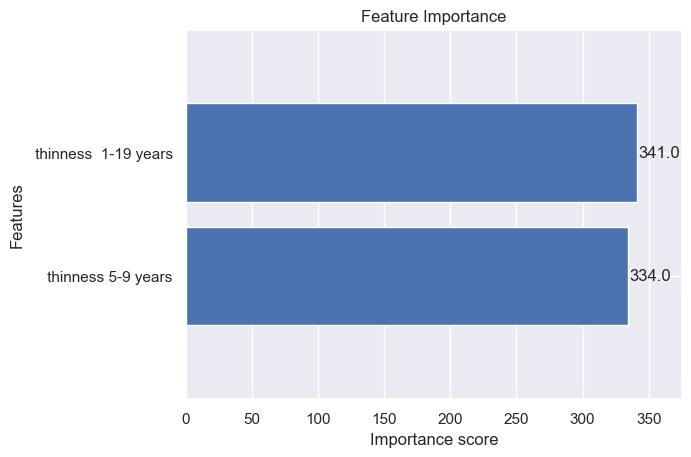

Train R² Score: 0.5174830158444479
Test R² Score: 0.42912733946623416
Train MSE: 40.502773957852895
Test MSE: 54.14614810169871
Train MAE: 4.757943869945342
Test MAE: 5.344392758118195
Regression Line Equation (Test): y = 0.4233x + 37.7406


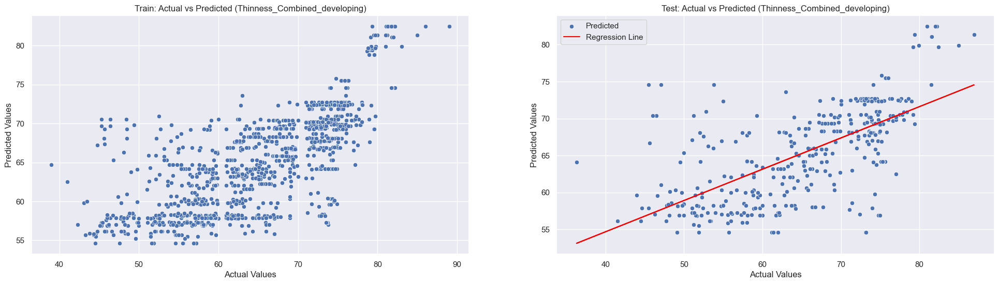

In [75]:
evaluate_xgboost_regressor(Thinness_Combined_developing_train, Thinness_Combined_developing_test, LE_developing_train, LE_developing_test, 
                                 feature_name="Thinness_Combined_developing", 
                                 max_depth=3, n_estimators=100, learning_rate=0.1)

## Random forest for developed 

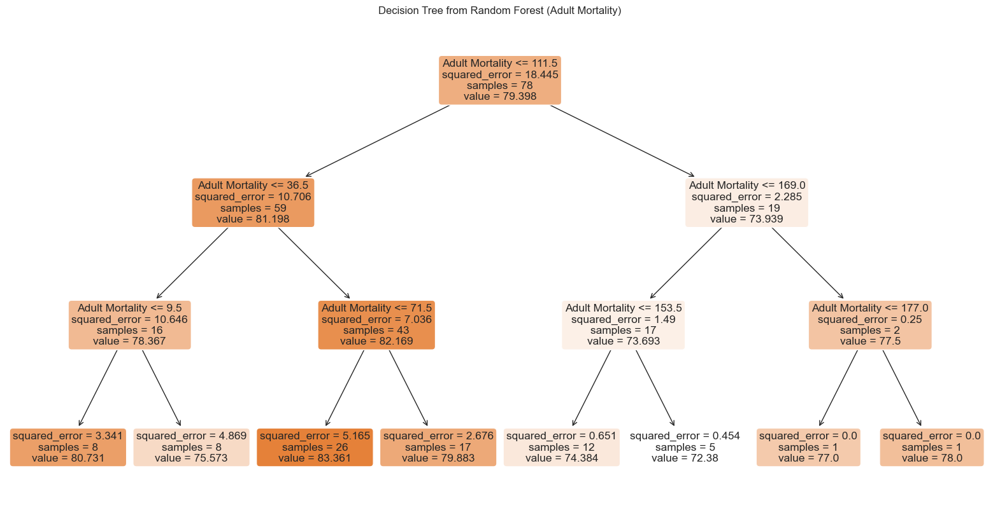

Train R² Score (Adult Mortality): 0.8358962599052406
Test R² Score (Adult Mortality): 0.6813880236231769
Train MSE (Adult Mortality): 3.010837208524587
Test MSE (Adult Mortality): 5.882675247644259
Train MAE (Adult Mortality): 1.2078948182802536
Test MAE (Adult Mortality): 1.6974284627044065


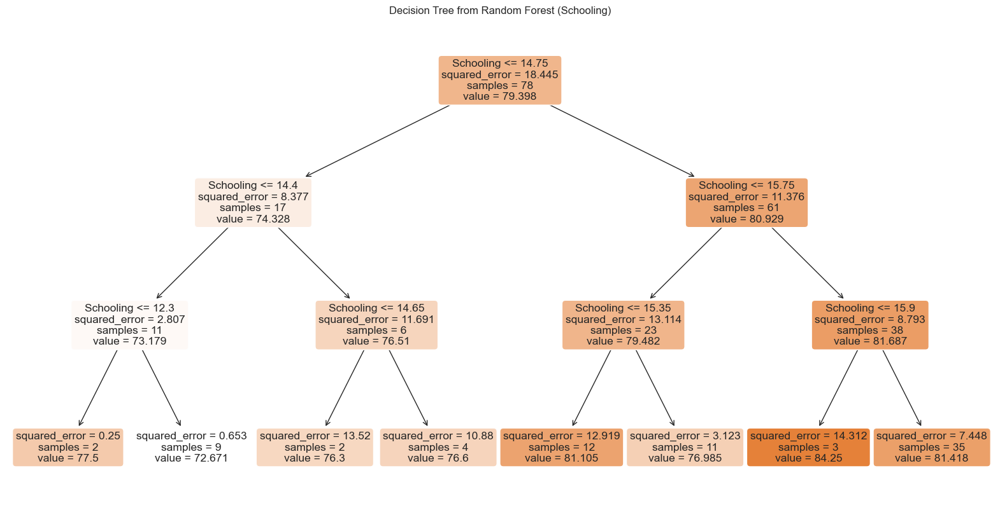

Train R² Score (Schooling): 0.576132563631735
Test R² Score (Schooling): 0.5440691077463705
Train MSE (Schooling): 7.7767627243753195
Test MSE (Schooling): 8.418055733487776
Train MAE (Schooling): 2.0778825545603254
Test MAE (Schooling): 2.1517143951100186


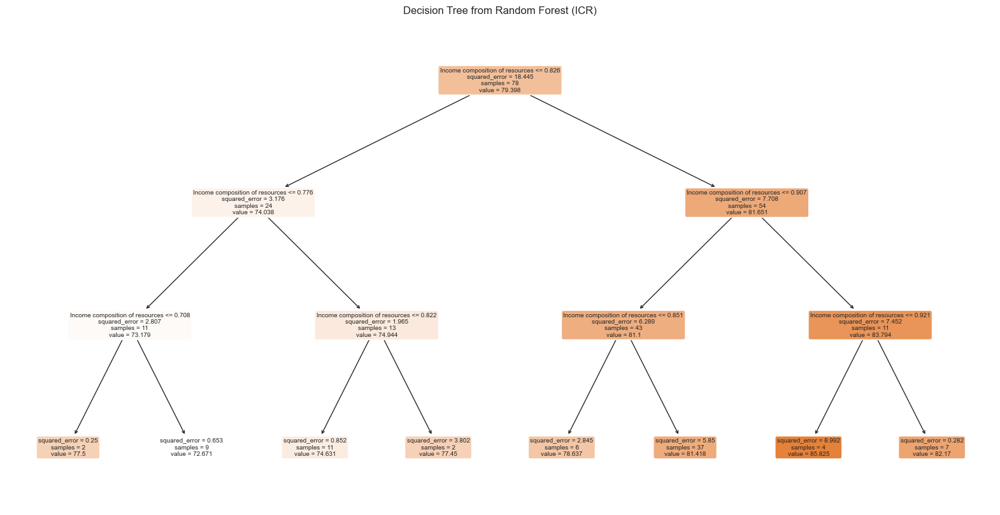

Train R² Score (ICR): 0.7911248501866684
Test R² Score (ICR): 0.6833460612789666
Train MSE (ICR): 3.832265325768829
Test MSE (ICR): 5.8465231237264605
Train MAE (ICR): 1.478390966031627
Test MAE (ICR): 1.7590755520443373


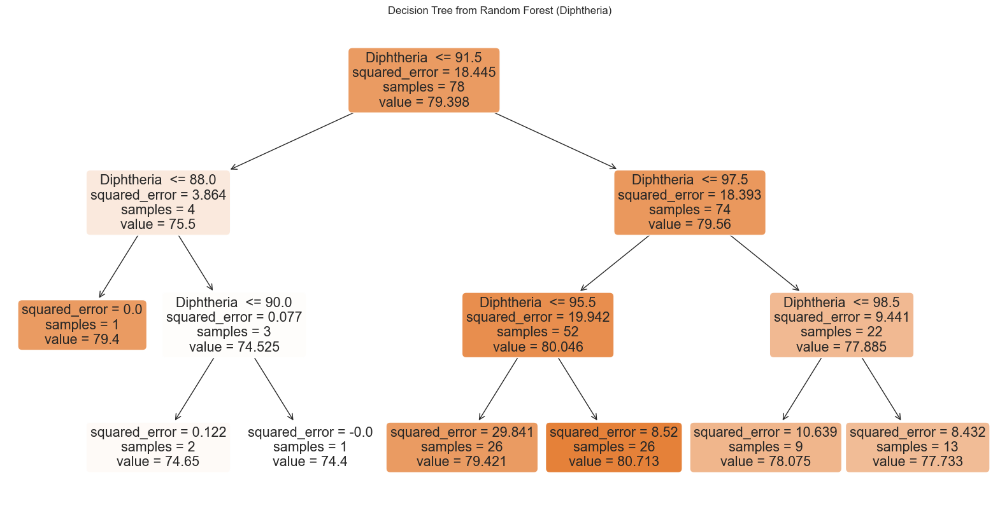

Train R² Score (Diphtheria): 0.1423495476615334
Test R² Score (Diphtheria): -0.013541329400863278
Train MSE (Diphtheria): 15.735448151989209
Test MSE (Diphtheria): 18.71346632582087
Train MAE (Diphtheria): 3.027448316435783
Test MAE (Diphtheria): 3.132893943586316


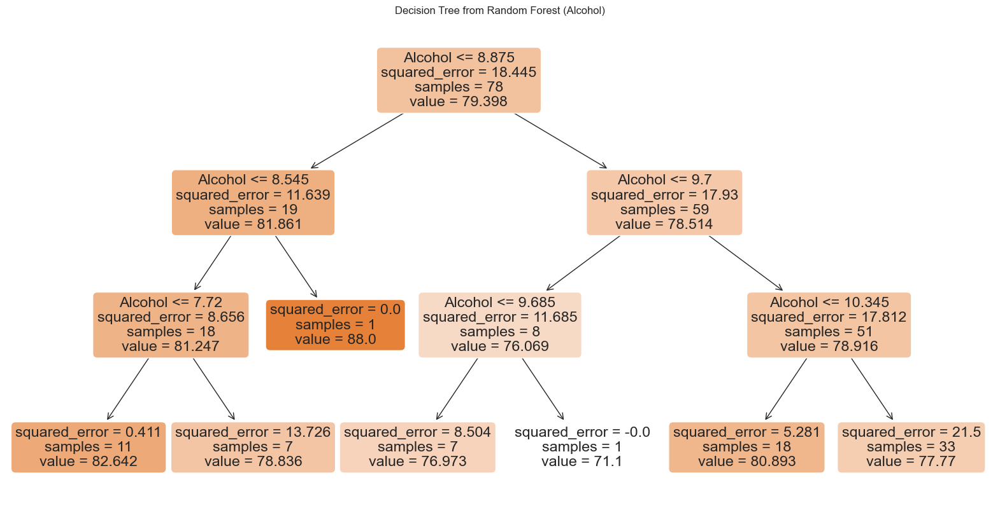

Train R² Score (Alcohol): 0.29620643840145344
Test R² Score (Alcohol): -0.010104414592446709
Train MSE (Alcohol): 12.912611505120813
Test MSE (Alcohol): 18.650009032401925
Train MAE (Alcohol): 2.8581483771409952
Test MAE (Alcohol): 3.0934831602789954


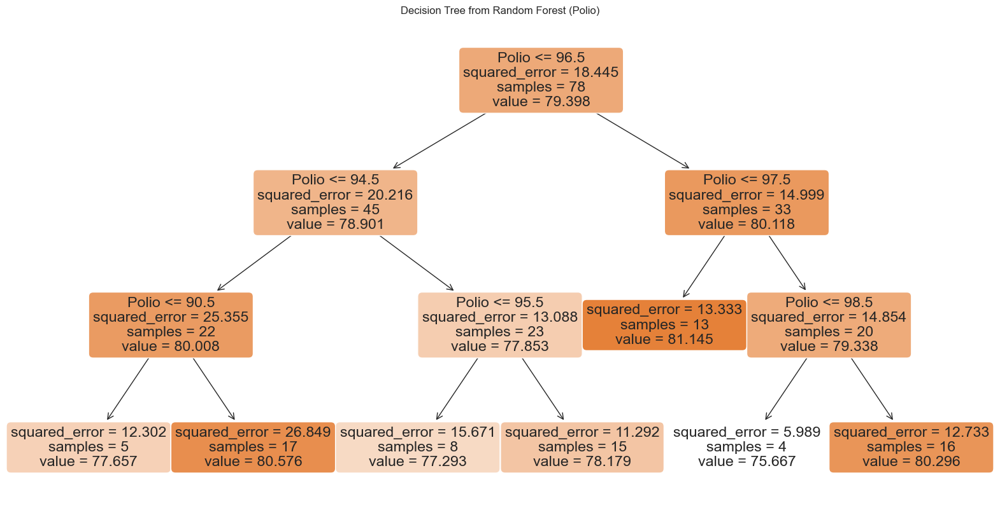

Train R² Score (Polio): 0.08729858849667449
Test R² Score (Polio): -0.001542664068816313
Train MSE (Polio): 16.74547678462619
Test MSE (Polio): 18.491929607847283
Train MAE (Polio): 3.3303717472818124
Test MAE (Polio): 3.262144866498962


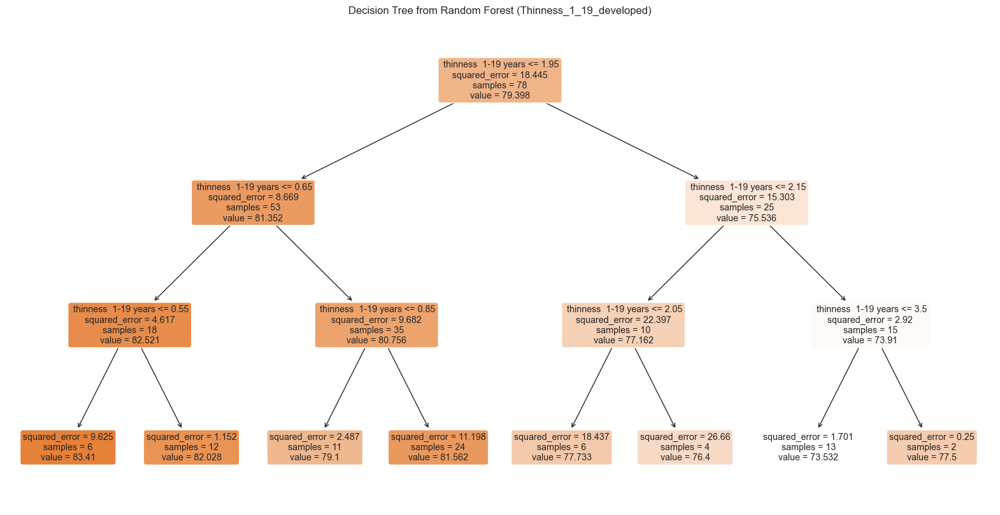

Train R² Score (Thinness_1_19_developed): 0.5982453976026149
Test R² Score (Thinness_1_19_developed): 0.599194826403846
Train MSE (Thinness_1_19_developed): 7.3710550709909
Test MSE (Thinness_1_19_developed): 7.400244964593774
Train MAE (Thinness_1_19_developed): 2.0290406335984112
Test MAE (Thinness_1_19_developed): 2.0683449138033216


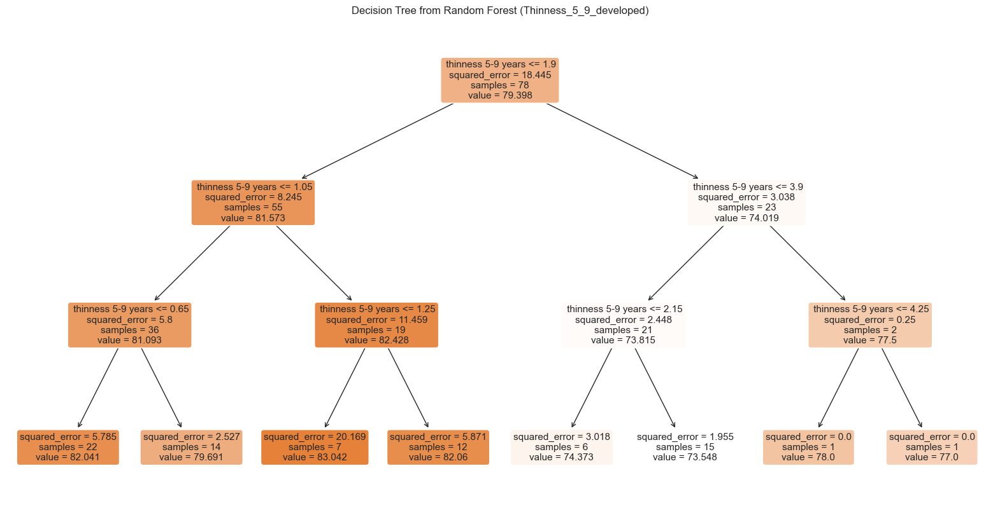

Train R² Score (Thinness_5_9_developed): 0.685918218739164
Test R² Score (Thinness_5_9_developed): 0.5649312298017095
Train MSE (Thinness_5_9_developed): 5.7625079903343694
Test MSE (Thinness_5_9_developed): 8.032869054619406
Train MAE (Thinness_5_9_developed): 1.794932596787905
Test MAE (Thinness_5_9_developed): 2.1379590377588715


In [77]:
# Adult Mortality
evaluate_random_forest_regressor(
    Adult_Mortality_developed_train, Adult_Mortality_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Adult Mortality",
    max_depth=3, n_estimators=100
)

# Schooling
evaluate_random_forest_regressor(
    Schooling_developed_train, Schooling_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Schooling",
    max_depth=3, n_estimators=100
)

# Income Composition of Resources (ICR)
evaluate_random_forest_regressor(
    ICR_developed_train, ICR_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="ICR",
    max_depth=3, n_estimators=100
)

# Diphtheria
evaluate_random_forest_regressor(
    Diphtheria_developed_train, Diphtheria_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Diphtheria",
    max_depth=3, n_estimators=100
)

# Alcohol
evaluate_random_forest_regressor(
    Alcohol_developed_train, Alcohol_developed_test,
    LE_developed_train, LE_developed_test,
    feature_name="Alcohol",
    max_depth=3, n_estimators=100
)

# Polio
evaluate_random_forest_regressor(
    Polio_developed_train, Polio_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Polio",
    max_depth=3, n_estimators=100
)


# Evaluate Random Forest for Thinness_1_19_developed
evaluate_random_forest_regressor(
    Thinness_1_19_developed_train, Thinness_1_19_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Thinness_1_19_developed",
    max_depth=3, n_estimators=100
)

# Evaluate Random Forest for Thinness_5_9_developed
evaluate_random_forest_regressor(
    Thinness_5_9_developed_train, Thinness_5_9_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Thinness_5_9_developed",
    max_depth=3, n_estimators=100
)




## Random forest for developed multi-variate 

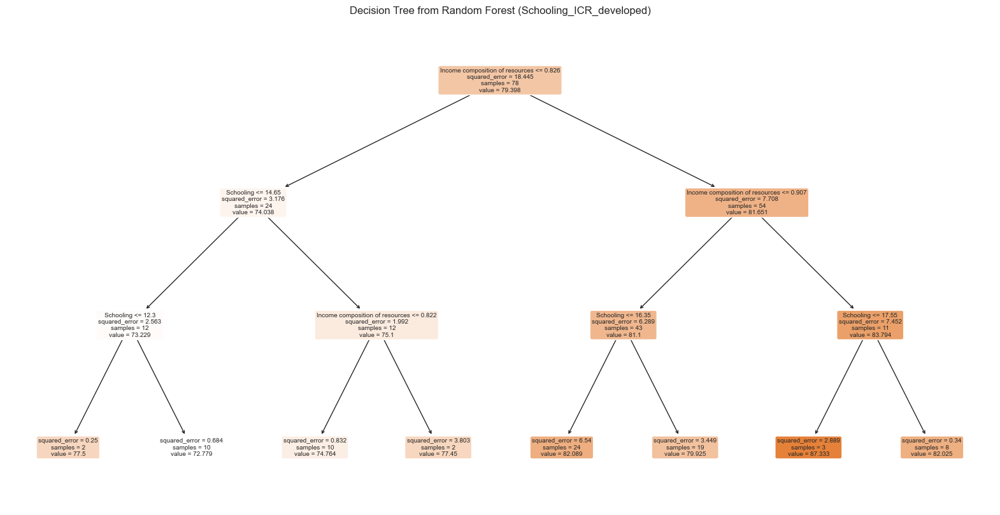

Train R² Score (Schooling_ICR_developed): 0.8141910279531419
Test R² Score (Schooling_ICR_developed): 0.7202442225695663
Train MSE (Schooling_ICR_developed): 3.409066523367135
Test MSE (Schooling_ICR_developed): 5.165255888966021
Train MAE (Schooling_ICR_developed): 1.3833220748114923
Test MAE (Schooling_ICR_developed): 1.6279531830352514


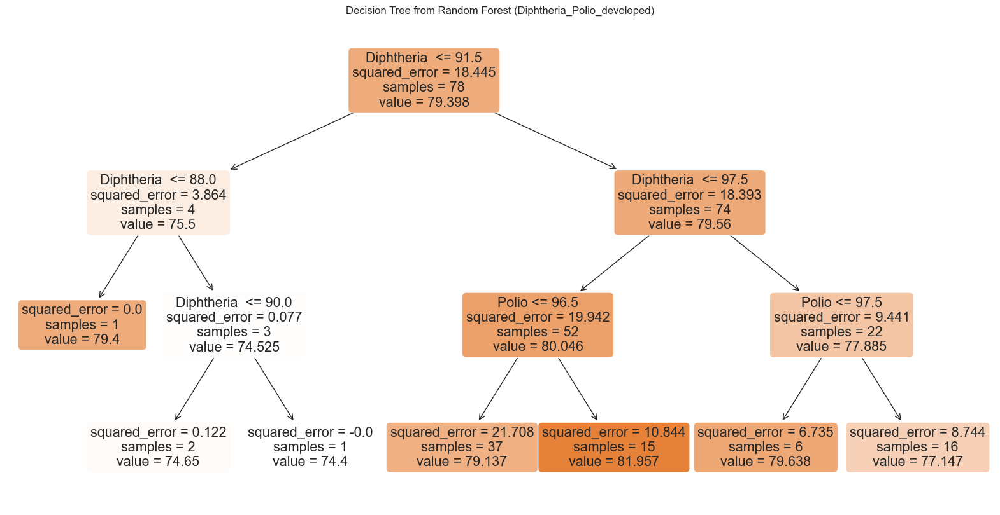

Train R² Score (Diphtheria_Polio_developed): 0.209895173153686
Test R² Score (Diphtheria_Polio_developed): -0.0008870547277304297
Train MSE (Diphtheria_Polio_developed): 14.496177905086808
Test MSE (Diphtheria_Polio_developed): 18.47982479971424
Train MAE (Diphtheria_Polio_developed): 2.920782346409489
Test MAE (Diphtheria_Polio_developed): 3.077530580771594


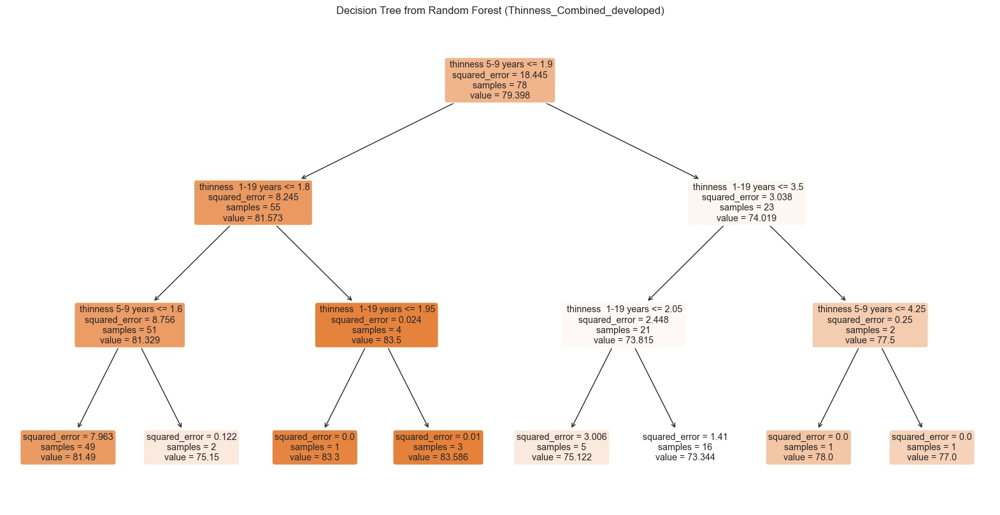

Train R² Score (Thinness_Combined_developed): 0.7304135308594408
Test R² Score (Thinness_Combined_developed): 0.5696531082452349
Train MSE (Thinness_Combined_developed): 4.946145479283211
Test MSE (Thinness_Combined_developed): 7.945686903596748
Train MAE (Thinness_Combined_developed): 1.667996142098984
Test MAE (Thinness_Combined_developed): 2.1039564879812156


In [79]:
# Evaluate Random Forest for Schooling_ICR_developed
evaluate_random_forest_regressor(
    Schooling_ICR_developed_train, Schooling_ICR_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Schooling_ICR_developed",
    max_depth=3, n_estimators=100
)

# Evaluate Random Forest for Diphtheria_Polio_developed
evaluate_random_forest_regressor(
    Diphtheria_Polio_developed_train, Diphtheria_Polio_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Diphtheria_Polio_developed",
    max_depth=3, n_estimators=100
)

# Evaluate Random Forest for Thinness_Combined_developed
evaluate_random_forest_regressor(
    Thinness_Combined_developed_train, Thinness_Combined_developed_test, LE_developed_train, LE_developed_test,
    feature_name="Thinness_Combined_developed",
    max_depth=3, n_estimators=100
)


## Random forest for developing 

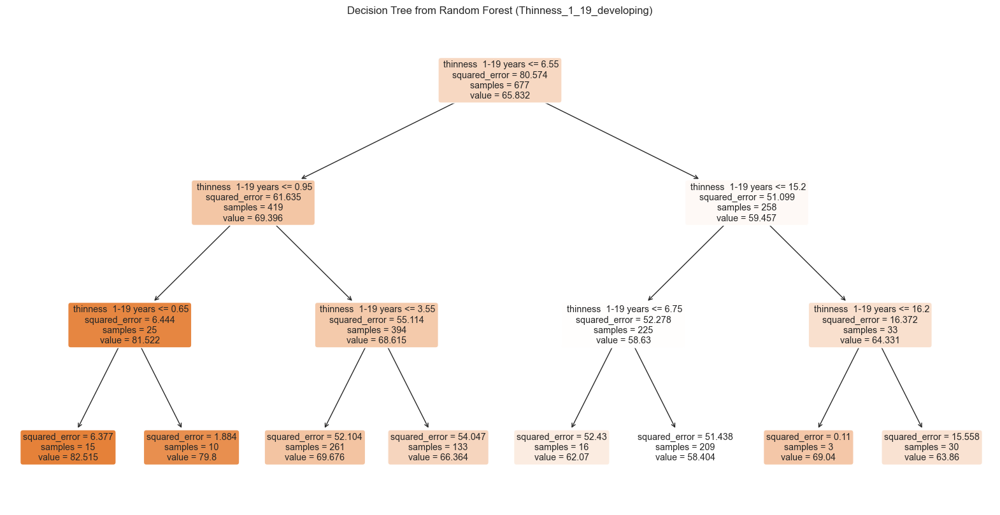

Train R² Score (Thinness_1_19_developing): 0.40579396898292874
Test R² Score (Thinness_1_19_developing): 0.4097116516124395
Train MSE (Thinness_1_19_developing): 49.87802160124323
Test MSE (Thinness_1_19_developing): 55.98768787528844
Train MAE (Thinness_1_19_developing): 5.479983701064628
Test MAE (Thinness_1_19_developing): 5.753684208743515


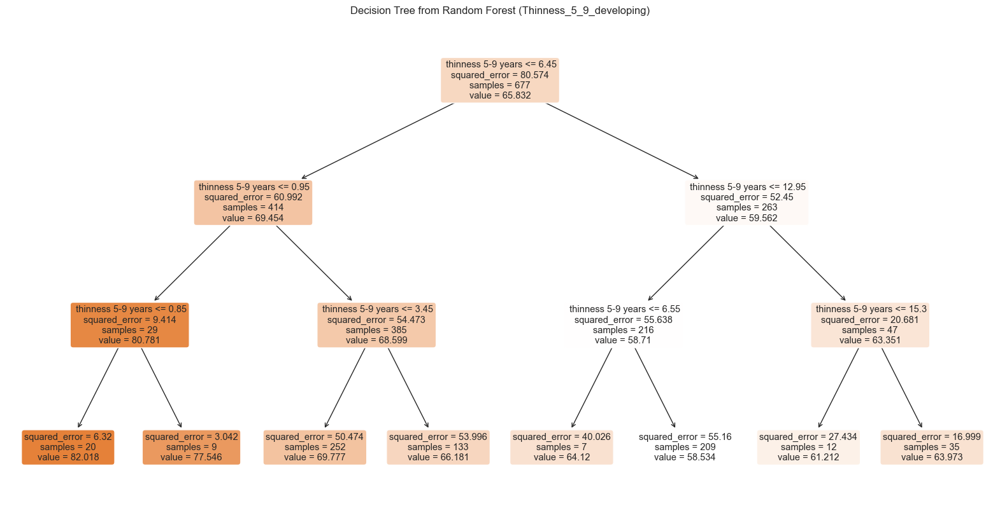

Train R² Score (Thinness_5_9_developing): 0.39974825682877
Test R² Score (Thinness_5_9_developing): 0.3878627821001345
Train MSE (Thinness_5_9_developing): 50.38550241712098
Test MSE (Thinness_5_9_developing): 58.06001013952478
Train MAE (Thinness_5_9_developing): 5.541023915455268
Test MAE (Thinness_5_9_developing): 5.835631049358315


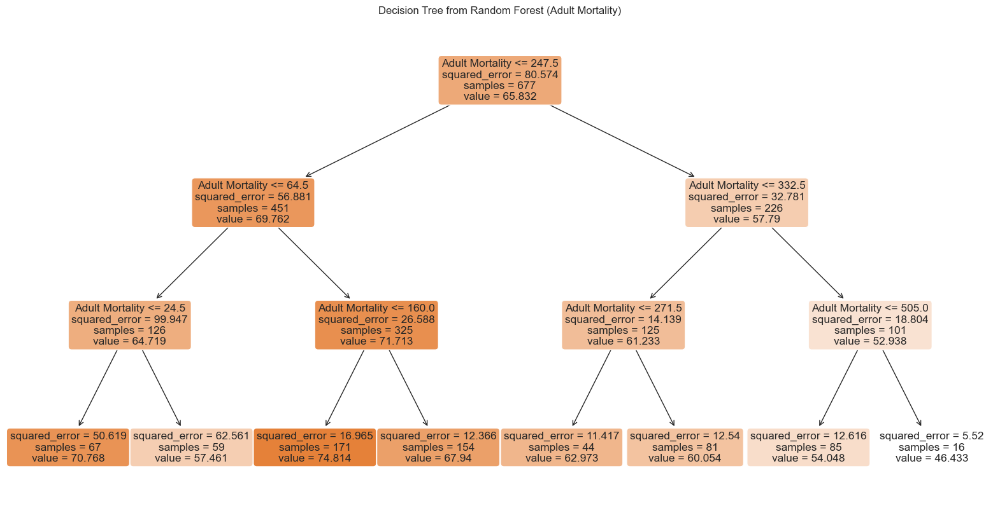

Train R² Score (Adult Mortality): 0.7661541052345835
Test R² Score (Adult Mortality): 0.7396134751490426
Train MSE (Adult Mortality): 19.629168977816043
Test MSE (Adult Mortality): 24.697149317124587
Train MAE (Adult Mortality): 3.1158924072881726
Test MAE (Adult Mortality): 3.413024622706106


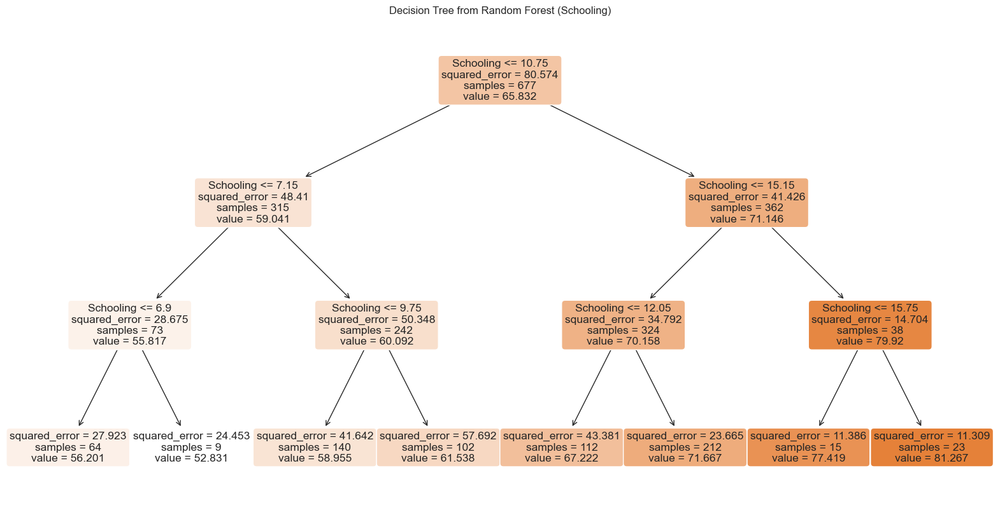

Train R² Score (Schooling): 0.5127713623339556
Test R² Score (Schooling): 0.5357046055121087
Train MSE (Schooling): 40.898273066422455
Test MSE (Schooling): 44.037504212186775
Train MAE (Schooling): 4.972248486186705
Test MAE (Schooling): 5.380311258045078


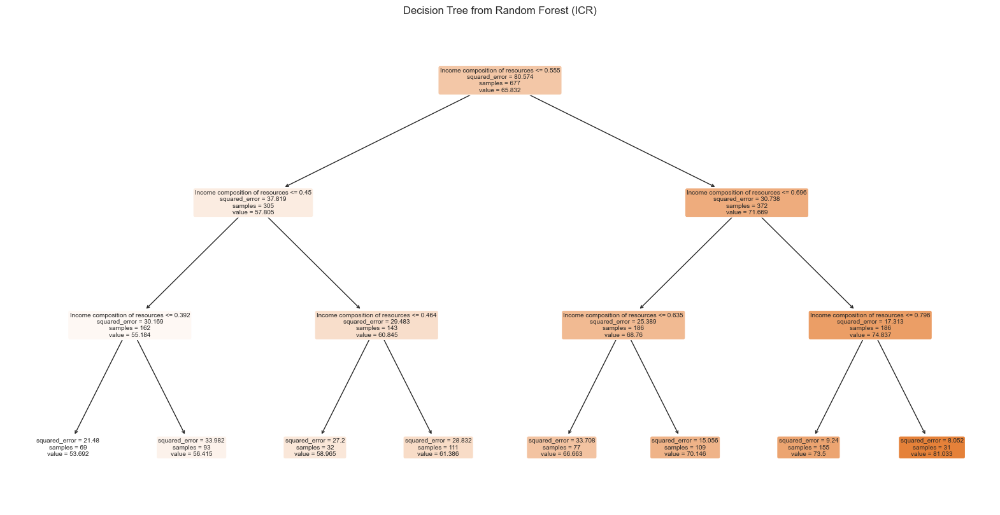

Train R² Score (ICR): 0.7220442778795755
Test R² Score (ICR): 0.7200778921005934
Train MSE (ICR): 23.331775156138384
Test MSE (ICR): 26.550060913916322
Train MAE (ICR): 3.688644113205476
Test MAE (ICR): 3.980849002480152


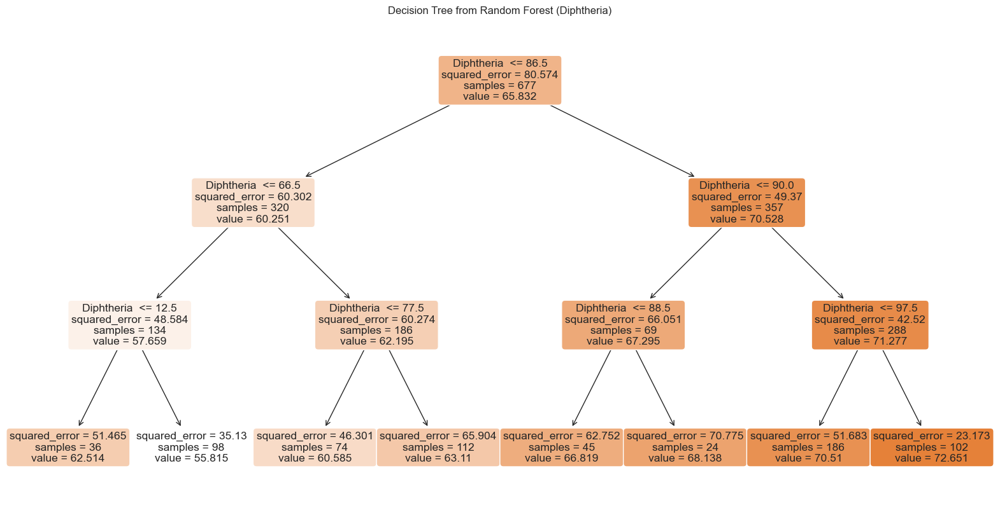

Train R² Score (Diphtheria): 0.3521363543488245
Test R² Score (Diphtheria): 0.30939756064991664
Train MSE (Diphtheria): 54.38207494652835
Test MSE (Diphtheria): 65.50228193706303
Train MAE (Diphtheria): 5.8434851340778176
Test MAE (Diphtheria): 6.464627260944357


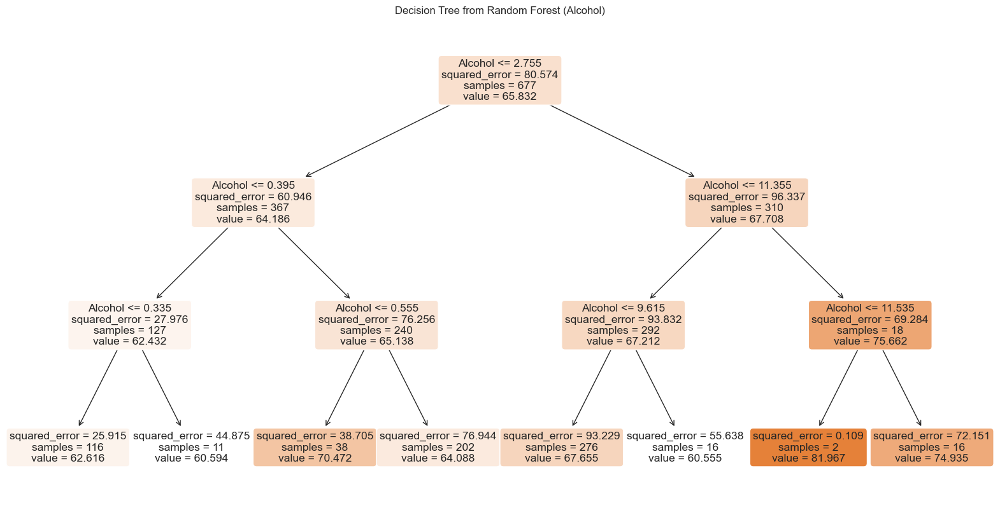

Train R² Score (Alcohol): 0.12365229557411428
Test R² Score (Alcohol): 0.041260440283986566
Train MSE (Alcohol): 73.56116809642153
Test MSE (Alcohol): 90.9345599819107
Train MAE (Alcohol): 7.106410556699105
Test MAE (Alcohol): 7.923567415415438


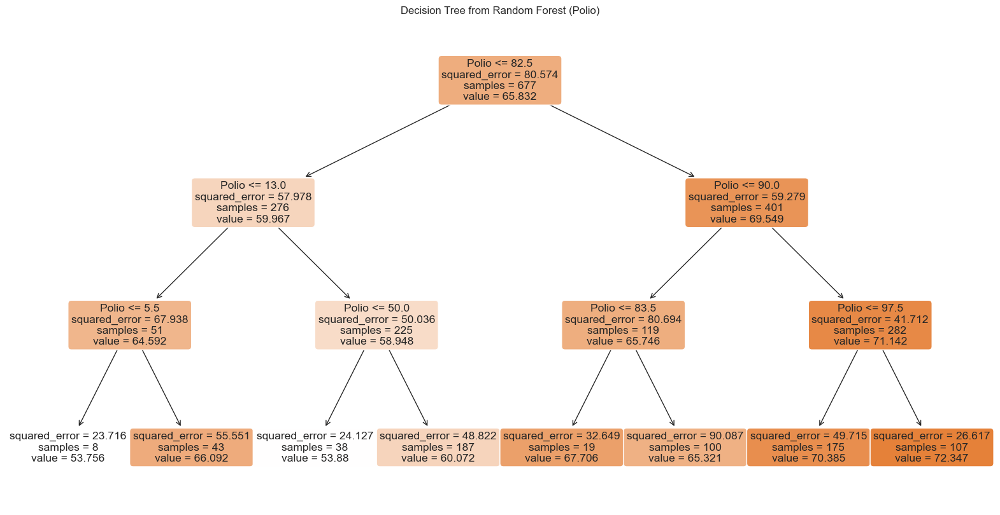

Train R² Score (Polio): 0.34754839852345276
Test R² Score (Polio): 0.30679359301429276
Train MSE (Polio): 54.76719079493492
Test MSE (Polio): 65.74926314145053
Train MAE (Polio): 5.818533452467429
Test MAE (Polio): 6.49900207126972


In [81]:
# Evaluate Random Forest for Thinness_1_19_developing
evaluate_random_forest_regressor(
    Thinness_1_19_developing_train, Thinness_1_19_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Thinness_1_19_developing",
    max_depth=3, n_estimators=100
)

# Evaluate Random Forest for Thinness_5_9_developing
evaluate_random_forest_regressor(
    Thinness_5_9_developing_train, Thinness_5_9_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Thinness_5_9_developing",
    max_depth=3, n_estimators=100
)

# Adult Mortality
evaluate_random_forest_regressor(
    Adult_Mortality_developing_train, Adult_Mortality_developing_test,
    LE_developing_train, LE_developing_test,
    feature_name="Adult Mortality",
    max_depth=3, n_estimators=100
)

# Schooling
evaluate_random_forest_regressor(
    Schooling_developing_train, Schooling_developing_test,
    LE_developing_train, LE_developing_test,
    feature_name="Schooling",
    max_depth=3, n_estimators=100
)

# Income Composition of Resources (ICR)
evaluate_random_forest_regressor(
    ICR_developing_train, ICR_developing_test,
    LE_developing_train, LE_developing_test,
    feature_name="ICR",
    max_depth=3, n_estimators=100
)

# Diphtheria
evaluate_random_forest_regressor(
    Diphtheria_developing_train, Diphtheria_developing_test,
    LE_developing_train, LE_developing_test,
    feature_name="Diphtheria",
    max_depth=3, n_estimators=100
)

# Alcohol
evaluate_random_forest_regressor(
    Alcohol_developing_train, Alcohol_developing_test,
    LE_developing_train, LE_developing_test,
    feature_name="Alcohol",
    max_depth=3, n_estimators=100
)

# Polio
evaluate_random_forest_regressor(
    Polio_developing_train, Polio_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Polio",
    max_depth=3, n_estimators=100
)


## Random forest for developing multi-variates 

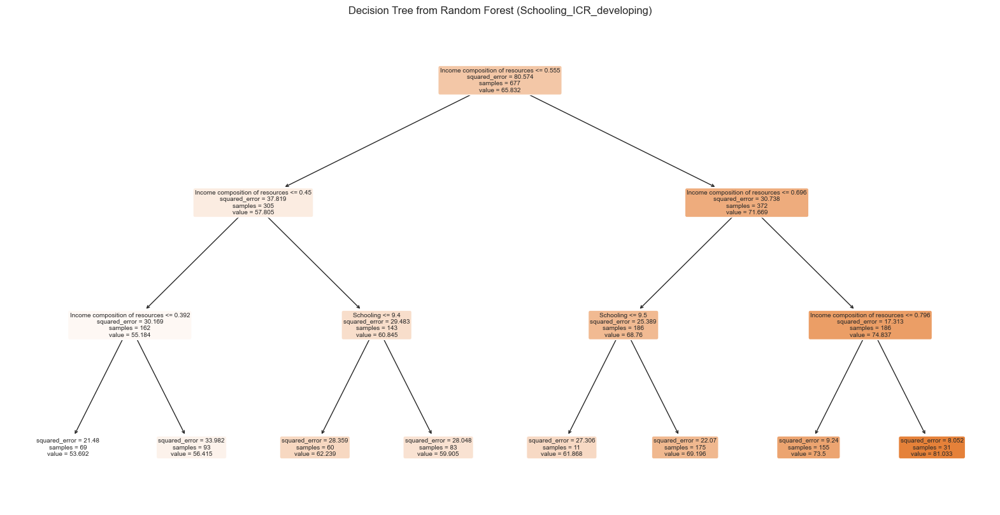

Train R² Score (Schooling_ICR_developing): 0.7352784401270449
Test R² Score (Schooling_ICR_developing): 0.7244625216479608
Train MSE (Schooling_ICR_developing): 22.220891395292345
Test MSE (Schooling_ICR_developing): 26.134187432392682
Train MAE (Schooling_ICR_developing): 3.598595299420881
Test MAE (Schooling_ICR_developing): 3.9255113917217743


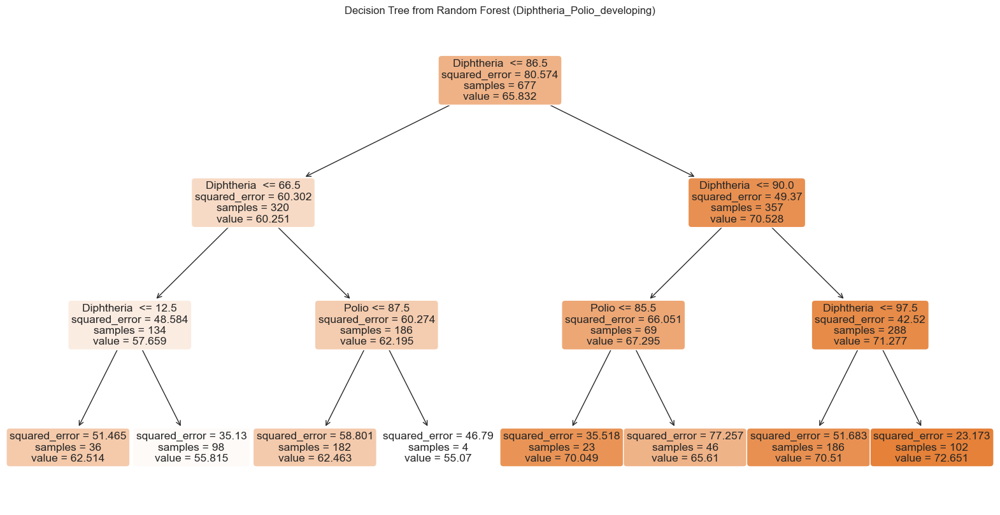

Train R² Score (Diphtheria_Polio_developing): 0.36454814216380504
Test R² Score (Diphtheria_Polio_developing): 0.3149096151642493
Train MSE (Diphtheria_Polio_developing): 53.3402218039643
Test MSE (Diphtheria_Polio_developing): 64.97947441673331
Train MAE (Diphtheria_Polio_developing): 5.754489671990363
Test MAE (Diphtheria_Polio_developing): 6.425888235783003


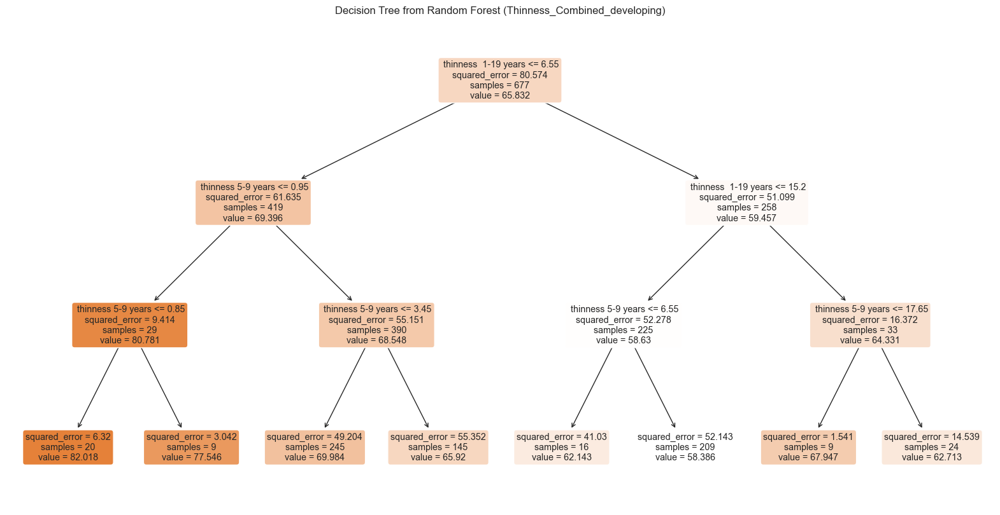

Train R² Score (Thinness_Combined_developing): 0.41945492417870256
Test R² Score (Thinness_Combined_developing): 0.41304843719555295
Train MSE (Thinness_Combined_developing): 48.73131257645912
Test MSE (Thinness_Combined_developing): 55.67120033111713
Train MAE (Thinness_Combined_developing): 5.384367406771761
Test MAE (Thinness_Combined_developing): 5.646244652267137


In [83]:
evaluate_random_forest_regressor(
    Schooling_ICR_developing_train, Schooling_ICR_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Schooling_ICR_developing",
    max_depth=3, n_estimators=100
)
evaluate_random_forest_regressor(
    Diphtheria_Polio_developing_train, Diphtheria_Polio_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Diphtheria_Polio_developing",
    max_depth=3, n_estimators=100
)
evaluate_random_forest_regressor(
    Thinness_Combined_developing_train, Thinness_Combined_developing_test, LE_developing_train, LE_developing_test,
    feature_name="Thinness_Combined_developing",
    max_depth=3, n_estimators=100
)

## In conclusion, for both developing and developed countries, the best indicators of life expectancy is actually socioeconomic factors, thinness and adult mortality. Specifically the best indicators is adult mortality, followed by income, schooling, thinness. To improve life expectancy we would have to target these few fronts.

## adult mortality, shift more healthcare resources to adults aged between 15-60
## income, schooling, focus more on education that would eventually allow higher income and longer life expectancy
## Thinness among youths, provide more education in schools on nutritious foods to reduce thinness as it may lead to long term health issues

📌 Approximated Equation for Developed Countries:
Life Expectancy = (-0.0202 * x² + 77.9975 * x + 2483.0615) / (x + 32.4862)


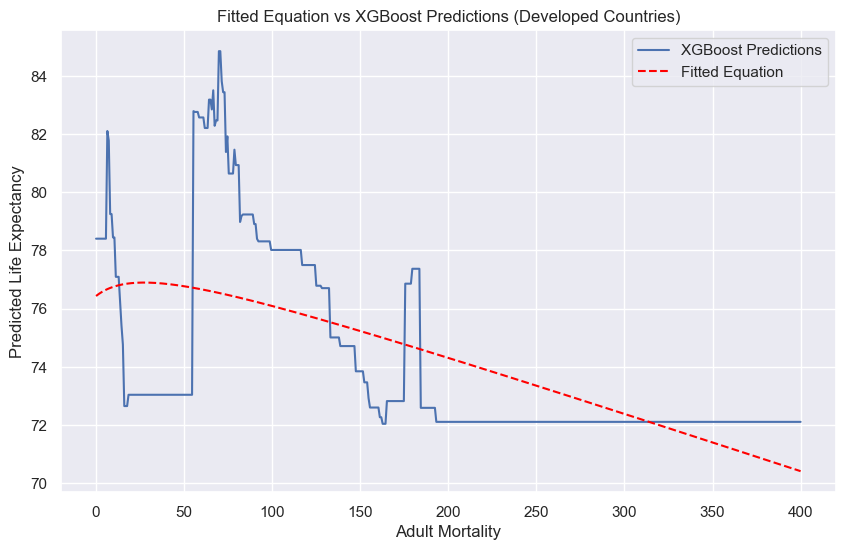

In [85]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

xgboost_model = xgb.XGBRegressor(max_depth=3, n_estimators=100, learning_rate=0.1)
xgboost_model.fit(Adult_Mortality_developed_train, LE_developed_train)


x_vals = np.linspace(0, 400, 500).reshape(-1, 1)
y_preds = xgboost_model.predict(x_vals)

def rational_func(x, a, b, c, d):
    return (a * x**2 + b * x + c) / (x + d)

popt, _ = curve_fit(rational_func, x_vals.ravel(), y_preds)
a, b, c, d = popt


print(f"📌 Approximated Equation for Developed Countries:")
print(f"Life Expectancy = ({a:.4f} * x² + {b:.4f} * x + {c:.4f}) / (x + {d:.4f})")


plt.figure(figsize=(10, 6))
plt.plot(x_vals, y_preds, label="XGBoost Predictions")
plt.plot(x_vals, rational_func(x_vals.ravel(), *popt), '--', label="Fitted Equation", color='red')
plt.xlabel("Adult Mortality")
plt.ylabel("Predicted Life Expectancy")
plt.title("Fitted Equation vs XGBoost Predictions (Developed Countries)")
plt.legend()
plt.grid(True)
plt.show()


📌 Approximated Equation (ICR fixed at 0.84):
Life Expectancy = (-3.7523 * x² + 179.9786 * x + 2137.2111) / (x + 35.0398)


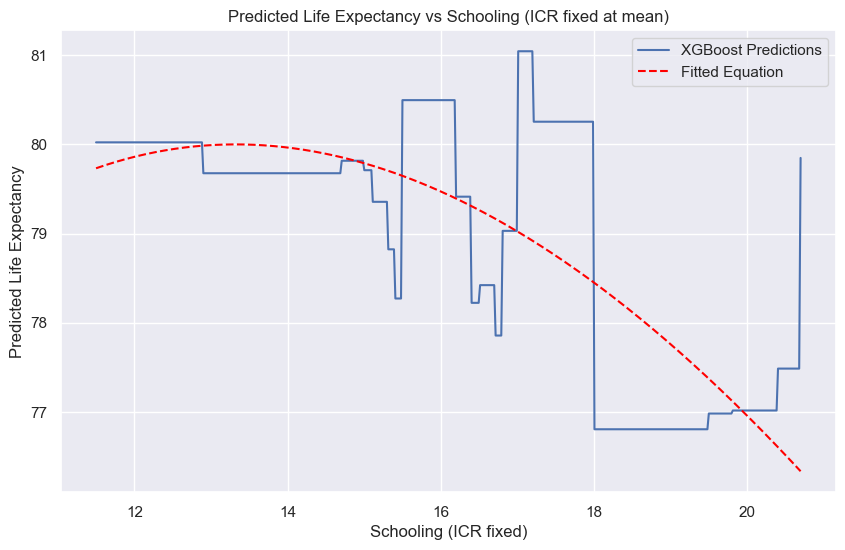

In [86]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

xgboost_model = xgb.XGBRegressor(max_depth=3, n_estimators=100, learning_rate=0.1)
xgboost_model.fit(Schooling_ICR_developed_train, LE_developed_train)


min_val = Schooling_ICR_developed_train.iloc[:, 0].min()
max_val = Schooling_ICR_developed_train.iloc[:, 0].max()
icr_mean = Schooling_ICR_developed_train.iloc[:, 1].mean()


schooling_range = np.linspace(min_val, max_val, 500)
X_input = np.column_stack([schooling_range, np.full_like(schooling_range, icr_mean)])


y_preds = xgboost_model.predict(X_input)


def rational_func(x, a, b, c, d):
    return (a * x**2 + b * x + c) / (x + d)

popt, _ = curve_fit(rational_func, schooling_range, y_preds)
a, b, c, d = popt


print(f"\n📌 Approximated Equation (ICR fixed at {icr_mean:.2f}):")
print(f"Life Expectancy = ({a:.4f} * x² + {b:.4f} * x + {c:.4f}) / (x + {d:.4f})")


plt.figure(figsize=(10, 6))
plt.plot(schooling_range, y_preds, label="XGBoost Predictions")
plt.plot(schooling_range, rational_func(schooling_range, *popt), '--', label="Fitted Equation", color='red')
plt.xlabel("Schooling (ICR fixed)")
plt.ylabel("Predicted Life Expectancy")
plt.title("Predicted Life Expectancy vs Schooling (ICR fixed at mean)")
plt.legend()
plt.grid(True)
plt.show()



📌 Approximated Equation (non-linear):
Predicted Life Expectancy = (-0.0375 * x² + 75.2207 * x + -5654.9617) / (x + -78.2901)


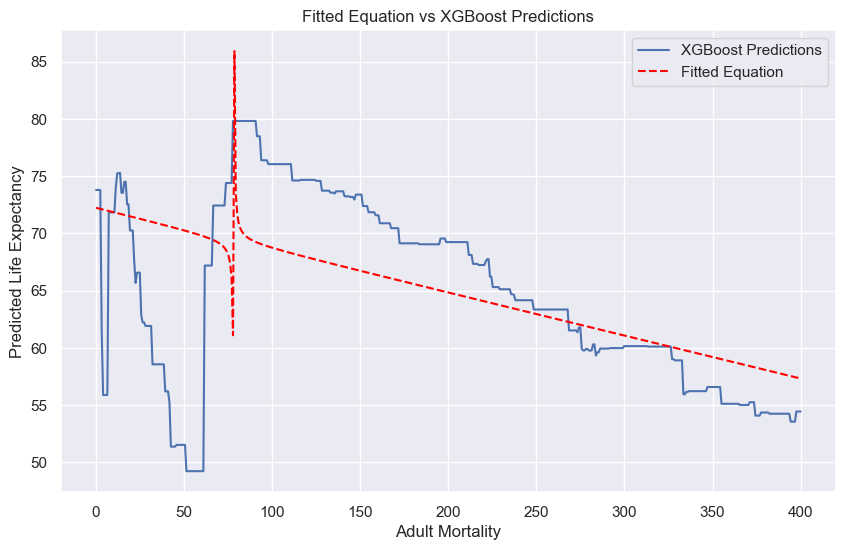

In [87]:
from scipy.optimize import curve_fit


x_range = np.linspace(0, 400, 500).reshape(-1, 1)


xgboost_model = xgb.XGBRegressor(max_depth=3, n_estimators=100, learning_rate=0.1)
xgboost_model.fit(Adult_Mortality_developing_train, LE_developing_train)
y_preds = xgboost_model.predict(x_range)


def curve_func(x, a, b, c, d):
    return (a * x**2 + b * x + c) / (x + d)

popt, _ = curve_fit(curve_func, x_range.ravel(), y_preds)
a, b, c, d = popt


print(f"\n📌 Approximated Equation (non-linear):")
print(f"Predicted Life Expectancy = ({a:.4f} * x² + {b:.4f} * x + {c:.4f}) / (x + {d:.4f})")


plt.figure(figsize=(10, 6))
plt.plot(x_range, y_preds, label="XGBoost Predictions")
plt.plot(x_range, curve_func(x_range.ravel(), *popt), '--', color='red', label="Fitted Equation")
plt.xlabel("Adult Mortality")
plt.ylabel("Predicted Life Expectancy")
plt.title("Fitted Equation vs XGBoost Predictions")
plt.legend()
plt.grid(True)
plt.show()



📌 Approximated Equation (ICR fixed at 0.58):
Life Expectancy = (-4.4326 * x² + 134.6008 * x + 1196.8634) / (x + 23.0437)


/var/folders/5j/frg2fp6n6kvg1t51v16fvjcm0000gn/T/ipykernel_41942/2532113528.py:14: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  schooling_range = np.linspace(min_vals[0], max_vals[0], 500)


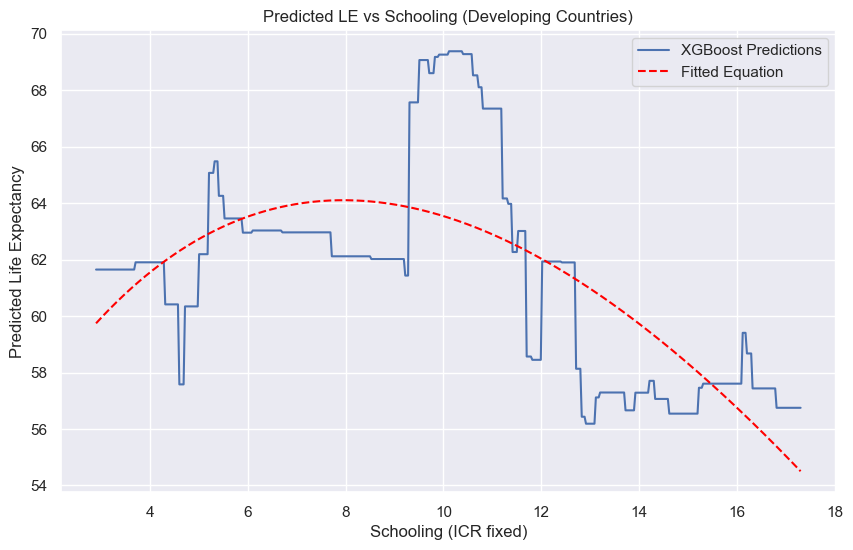

In [88]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb


xgboost_model = xgb.XGBRegressor(max_depth=3, n_estimators=100, learning_rate=0.1)
xgboost_model.fit(Schooling_ICR_developing_train, LE_developing_train)


min_vals = Schooling_ICR_developing_train.min()
max_vals = Schooling_ICR_developing_train.max()

schooling_range = np.linspace(min_vals[0], max_vals[0], 500)
icr_mean = Schooling_ICR_developing_train.iloc[:, 1].mean()

X_input = np.column_stack([schooling_range, np.full_like(schooling_range, icr_mean)])


y_preds = xgboost_model.predict(X_input)


def rational_func(x, a, b, c, d):
    return (a * x**2 + b * x + c) / (x + d)

popt, _ = curve_fit(rational_func, schooling_range, y_preds)
a, b, c, d = popt

print(f"\n📌 Approximated Equation (ICR fixed at {icr_mean:.2f}):")
print(f"Life Expectancy = ({a:.4f} * x² + {b:.4f} * x + {c:.4f}) / (x + {d:.4f})")

plt.figure(figsize=(10, 6))
plt.plot(schooling_range, y_preds, label="XGBoost Predictions")
plt.plot(schooling_range, rational_func(schooling_range, *popt), '--', color='red', label="Fitted Equation")
plt.xlabel("Schooling (ICR fixed)")
plt.ylabel("Predicted Life Expectancy")
plt.title("Predicted LE vs Schooling (Developing Countries)")
plt.legend()
plt.grid(True)
plt.show()



📌 Approximated Equation (Polio fixed at 76.62):
Life Expectancy = (4.1152 * x² + -270.2164 * x + 50264.8121) / (x + 799.3519)


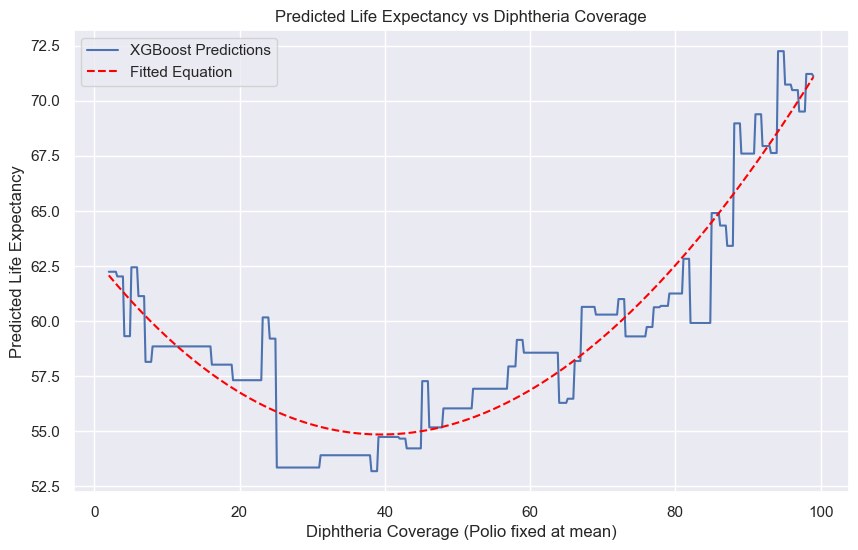

In [89]:
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb


xgboost_model = xgb.XGBRegressor(max_depth=3, n_estimators=100, learning_rate=0.1)
xgboost_model.fit(Diphtheria_Polio_developing_train, LE_developing_train)


min_vals = Diphtheria_Polio_developing_train.min()
max_vals = Diphtheria_Polio_developing_train.max()

diphtheria_range = np.linspace(min_vals.iloc[0], max_vals.iloc[0], 500)
polio_mean = Diphtheria_Polio_developing_train.iloc[:, 1].mean()


X_input = np.column_stack([diphtheria_range, np.full_like(diphtheria_range, polio_mean)])


y_preds = xgboost_model.predict(X_input)


def rational_func(x, a, b, c, d):
    return (a * x**2 + b * x + c) / (x + d)

popt, _ = curve_fit(rational_func, diphtheria_range, y_preds)
a, b, c, d = popt


print(f"\n📌 Approximated Equation (Polio fixed at {polio_mean:.2f}):")
print(f"Life Expectancy = ({a:.4f} * x² + {b:.4f} * x + {c:.4f}) / (x + {d:.4f})")


plt.figure(figsize=(10, 6))
plt.plot(diphtheria_range, y_preds, label="XGBoost Predictions")
plt.plot(diphtheria_range, rational_func(diphtheria_range, *popt), '--', color='red', label="Fitted Equation")
plt.xlabel("Diphtheria Coverage (Polio fixed at mean)")
plt.ylabel("Predicted Life Expectancy")
plt.title("Predicted Life Expectancy vs Diphtheria Coverage")
plt.legend()
plt.grid(True)
plt.show()